<a href="https://colab.research.google.com/github/PhongWind10/Project-KHDL/blob/colab/Nh%E1%BA%ADn_di%E1%BB%87n_%C4%91%C3%A1m_ch%C3%A1y_b%E1%BA%B1ng_m%C3%B4_h%C3%ACnh_h%E1%BB%8Dc_s%C3%A2u_CNN_3_Bi%E1%BA%BFn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1: KHỞI TẠO MÔI TRƯỜNG, KẾT NỐI GOOGLE DRIVE VÀ TẢI TẬP DỮ LIỆU

In [ ]:
import os
import time
import kagglehub
from google.colab import drive

# 1. Kết nối với Google Drive để lưu trữ kết quả đồ án
drive.mount('/content/drive')

# 2. Khởi tạo cấu trúc thư mục lưu trữ tự động cho Đồ án Cơ sở
folders = [
    '/content/drive/MyDrive/Do_an_co_so/KQ_EDA',
    '/content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen',
    '/content/drive/MyDrive/Do_an_co_so/Model',
    '/content/drive/MyDrive/Do_an_co_so/KQ_XAI'
]
for folder in folders:
    os.makedirs(folder, exist_ok=True)
    print(f"[+] Đã cấu hình và kiểm tra thư mục: {folder}")

# 3. Tải bộ dữ liệu phân loại đám cháy từ Kaggle thông qua API kagglehub
print("\n[---] Đang tiến hành tải tập dữ liệu từ Kaggle...")
path = kagglehub.dataset_download("amerzishminha/forest-fire-smoke-and-non-fire-image-dataset")
print(f"[+] Đường dẫn tập dữ liệu gốc lưu trên máy ảo: {path}")

Mounted at /content/drive
[+] Đã cấu hình và kiểm tra thư mục: /content/drive/MyDrive/Do_an_co_so/KQ_EDA
[+] Đã cấu hình và kiểm tra thư mục: /content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen
[+] Đã cấu hình và kiểm tra thư mục: /content/drive/MyDrive/Do_an_co_so/Model
[+] Đã cấu hình và kiểm tra thư mục: /content/drive/MyDrive/Do_an_co_so/KQ_XAI

[---] Đang tiến hành tải tập dữ liệu từ Kaggle...
Using Colab cache for faster access to the 'forest-fire-smoke-and-non-fire-image-dataset' dataset.
[+] Đường dẫn tập dữ liệu gốc lưu trên máy ảo: /kaggle/input/forest-fire-smoke-and-non-fire-image-dataset


## 2: ĐỌC DỮ LIỆU THÔ


In [ ]:
import os
import pandas as pd

filepaths = []
labels = []

# Duyệt cây thư mục dữ liệu và gán nhãn dựa trên tên thư mục cha
for root, dirs, files in os.walk(path):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp', '.gif', '.webp')):
            folder_name = os.path.basename(root).lower()
            if any(x in folder_name for x in [ 'non_fire', 'non-fire', 'non fire' ]):
                label = 'Non-Fire'
            elif 'fire' in folder_name:
                label = 'Fire'
            elif 'smoke' in folder_name:
                label = 'Smoke'
            else:
                continue
            filepaths.append(os.path.join(root, file))
            labels.append(label)

# Khởi tạo DataFrame lưu trữ đường dẫn và nhãn gốc
df = pd.DataFrame({'filepath': filepaths, 'label': labels})
initial_image_count = len(df)
print(f"[+] Tổng số lượng ảnh thô tìm thấy hệ thống: {initial_image_count}")
print(df['label'].value_counts())

[+] Tổng số lượng ảnh thô tìm thấy hệ thống: 42900
label
Smoke       14300
Non-Fire    14300
Fire        14300
Name: count, dtype: int64


## 3: TIỀN XỬ LÝ DỮ LIỆU


In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
from PIL import Image, UnidentifiedImageError
from sklearn.model_selection import train_test_split

print("[---] Đang kiểm tra tính toàn vẹn và lọc bỏ ảnh lỗi cấu trúc phần cứng...")

# Hàm kiểm tra ảnh lỗi cấu trúc bằng thư viện PIL
def check_image_corruption(filepath):
    try:
        with Image.open(filepath) as img:
            img.verify()
        return True
    except (IOError, SyntaxError, UnidentifiedImageError):
        return False

df['is_valid'] = df['filepath'].apply(check_image_corruption)
df_clean_pil = df[df['is_valid']].drop(columns=['is_valid'])
corrupted_images_count = initial_image_count - len(df_clean_pil)

print(f"Đã lọc bỏ {corrupted_images_count} ảnh bị lỗi cấu trúc vật lý bằng PIL.")
print(f"Tổng số ảnh còn lại sau bước lọc 1: {len(df_clean_pil)}")

# Phân chia dữ liệu theo tỷ lệ chuẩn: 70% Train - 15% Val - 15% Test
train_df, temp_df = train_test_split(df_clean_pil, train_size=0.7, shuffle=True, random_state=42, stratify=df_clean_pil['label'])
val_df, test_df = train_test_split(temp_df, train_size=0.5, shuffle=True, random_state=42, stratify=temp_df['label'])

# Ánh xạ nhãn văn bản thành số nguyên chuẩn hóa
class_indices = {'Fire': 0, 'Non-Fire': 1, 'Smoke': 2}
train_df['label_idx'] = train_df['label'].map(class_indices)
val_df['label_idx'] = val_df['label'].map(class_indices)
test_df['label_idx'] = test_df['label'].map(class_indices)

# Loại bỏ triệt để các định dạng ảnh dạng .tif / .tiff gây lỗi luồng decode của Tensorflow
train_df = train_df[~train_df['filepath'].str.lower().str.endswith(('.tif', '.tiff'))]
val_df = val_df[~val_df['filepath'].str.lower().str.endswith(('.tif', '.tiff'))]
test_df = test_df[~test_df['filepath'].str.lower().str.endswith(('.tif', '.tiff'))]

print("\n[---] Đang thực hiện kiểm tra bổ sung luồng giải mã đồ họa trực tiếp của TensorFlow...")
def check_tf_decoding(filepath):
    try:
        img = tf.io.read_file(filepath)
        tf.io.decode_image(img, channels=3, expand_animations=False)
        return True
    except Exception:
        return False

# Lọc ảnh không tương thích với bộ giải mã TensorFlow trên tập dữ liệu hình ảnh
train_df = train_df[train_df['filepath'].apply(check_tf_decoding)]
val_df = val_df[val_df['filepath'].apply(check_tf_decoding)]
test_df = test_df[test_df['filepath'].apply(check_tf_decoding)]

print(f"\nKích thước tập huấn luyện (Train size): {len(train_df)}")
print(f"Kích thước tập kiểm định (Validation size): {len(val_df)}")
print(f"Kích thước tập kiểm tra (Test size): {len(test_df)}")

# Cấu hình siêu tham số kích thước đầu vào và Batch Size
IMG_SIZE = (128, 128)
BATCH_SIZE = 64

# Xây dựng khối tăng cường dữ liệu tuần tự chuẩn (Giữ nguyên dải pixel 0-255 để tránh xung đột thuật toán)
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(factor=20/360),
    tf.keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
    tf.keras.layers.RandomZoom(height_factor=0.1)
])

# Hàm tải ảnh và chuyển đổi One-Hot vector cho nhãn phân loại
def process_path(file_path, label):
    img = tf.io.read_file(file_path)
    img = tf.io.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, IMG_SIZE)
    img.set_shape([IMG_SIZE[0], IMG_SIZE[1], 3])
    return img, tf.one_hot(label, depth=3)

# Hàm bọc thực hiện tăng cường dữ liệu huấn luyện hình ảnh
def augment(img, label):
    return data_augmentation(img, training=True), label

# Tạo luồng dữ liệu tối ưu hóa bộ nhớ đệm (Pipeline Dataset)
def create_dataset(dataframe, is_training=False):
    ds = tf.data.Dataset.from_tensor_slices((dataframe['filepath'].values, dataframe['label_idx'].values))
    if is_training:
        ds = ds.shuffle(buffer_size=len(dataframe))
    ds = ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    if is_training:
        ds = ds.map(augment, num_parallel_calls=tf.data.AUTOTUNE)
    return ds.prefetch(buffer_size=tf.data.AUTOTUNE)

train_dataset = create_dataset(train_df, is_training=True)
val_dataset = create_dataset(val_df, is_training=False)
test_dataset = create_dataset(test_df, is_training=False)

print("[+] Đã cấu hình và thiết lập thành công tf.data.Dataset siêu sạch!")

# Xuất thông tin cấu trúc tập dữ liệu phân rã ra tệp CSV lưu trên Drive
csv_save_path = '/content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen'
train_df.to_csv(f'{csv_save_path}/train_data_info.csv', index=False)
val_df.to_csv(f'{csv_save_path}/validation_data_info.csv', index=False)
test_df.to_csv(f'{csv_save_path}/test_data_info.csv', index=False)
print("[+] Đã xuất các tệp CSV nhật ký thông tin dữ liệu thành công!")

[---] Đang kiểm tra tính toàn vẹn và lọc bỏ ảnh lỗi cấu trúc phần cứng...
Đã lọc bỏ 0 ảnh bị lỗi cấu trúc vật lý bằng PIL.
Tổng số ảnh còn lại sau bước lọc 1: 42900

[---] Đang thực hiện kiểm tra bổ sung luồng giải mã đồ họa trực tiếp của TensorFlow...

Kích thước tập huấn luyện (Train size): 28819
Kích thước tập kiểm định (Validation size): 6183
Kích thước tập kiểm tra (Test size): 6150
[+] Đã cấu hình và thiết lập thành công tf.data.Dataset siêu sạch!
[+] Đã xuất các tệp CSV nhật ký thông tin dữ liệu thành công!


## 4: VẼ CÁC BIỂU ĐỒ PHÂN TÍCH DỮ LIỆU (EDA)

[---] Khởi chạy hệ thống tự động tạo đồ thị phân tích dữ liệu chuyên nghiệp...
-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/1_class_distribution_comparison.png


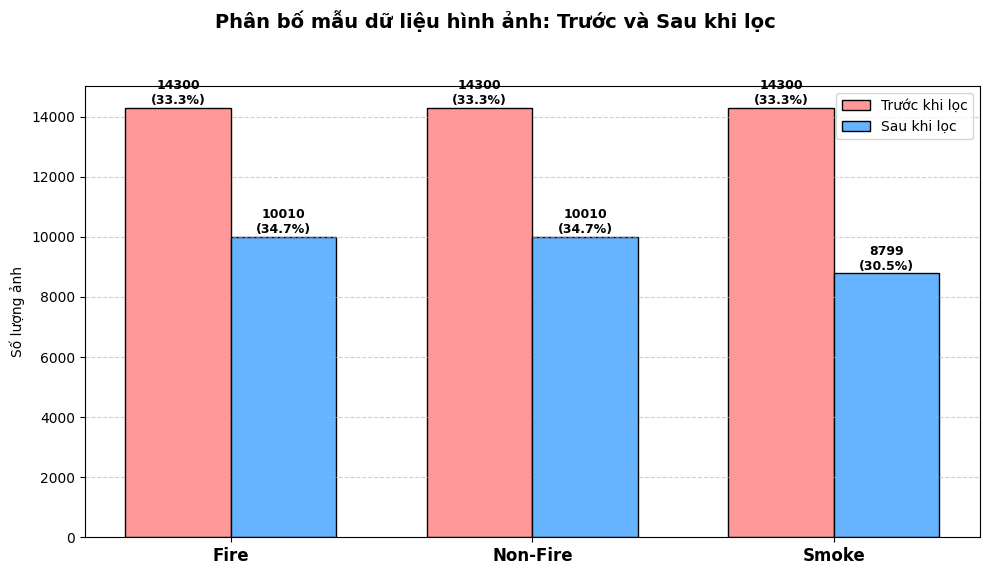

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/2_combined_physical_properties.png


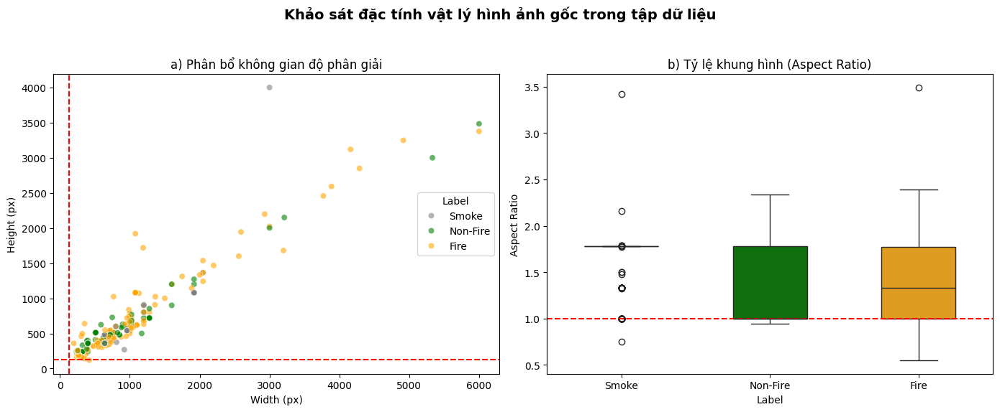

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/3_rgb_histograms.png


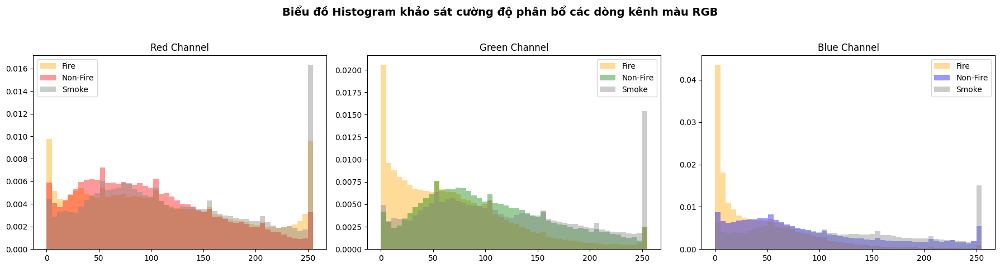

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/4_pixel_mean_std.png


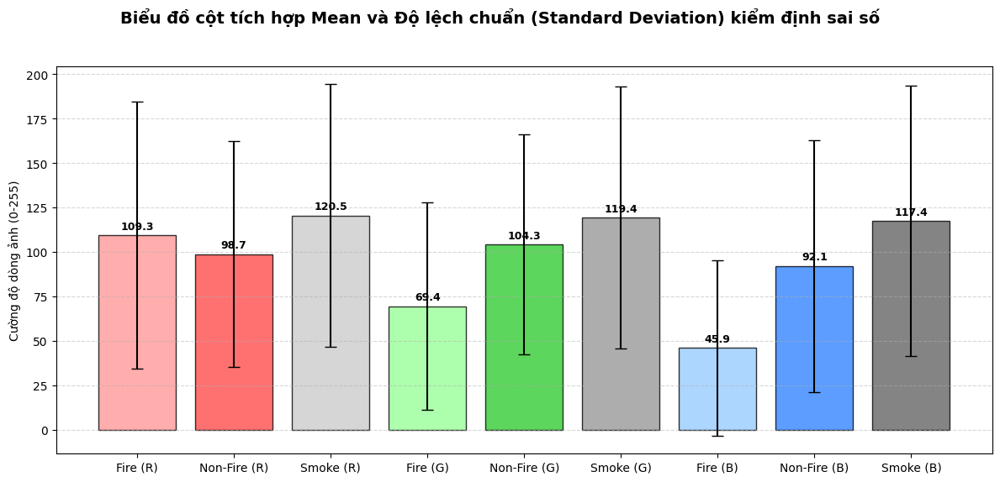

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/5_random_grid_fire.png


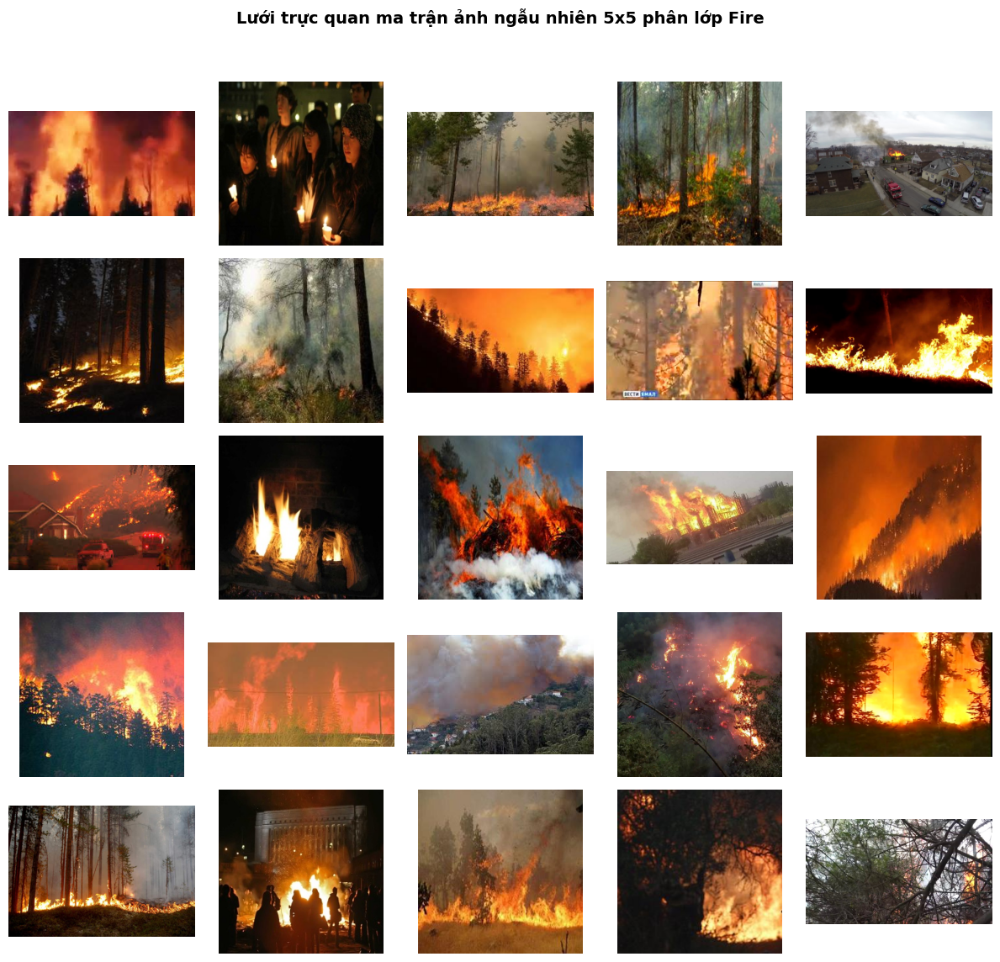

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/5_random_grid_non-fire.png


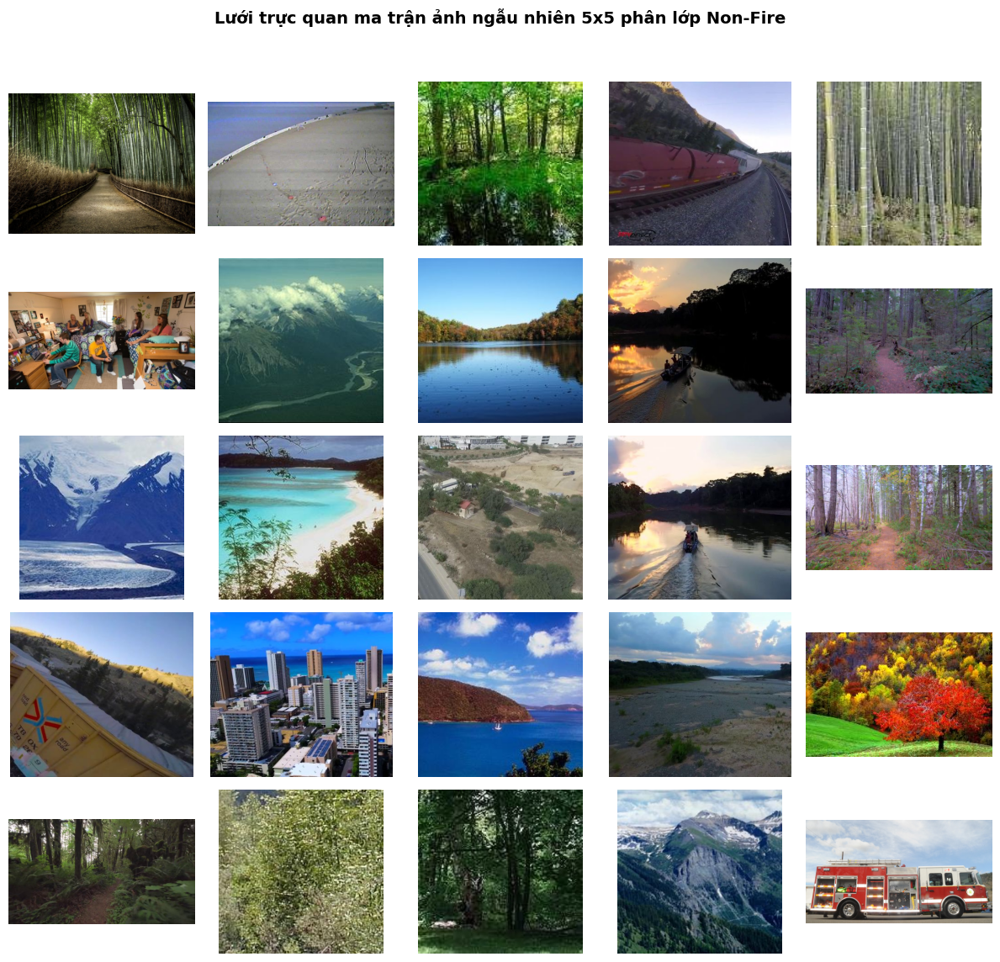

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/5_random_grid_smoke.png


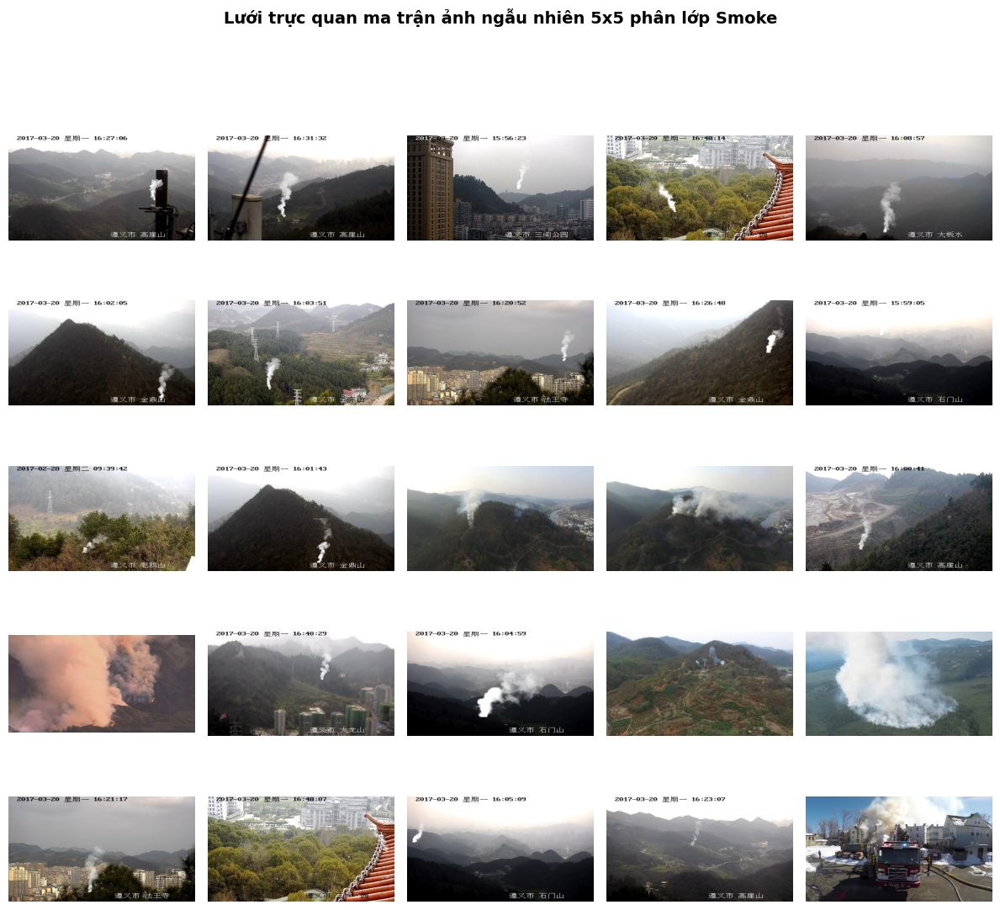

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/6_data_augmentation_examples.png


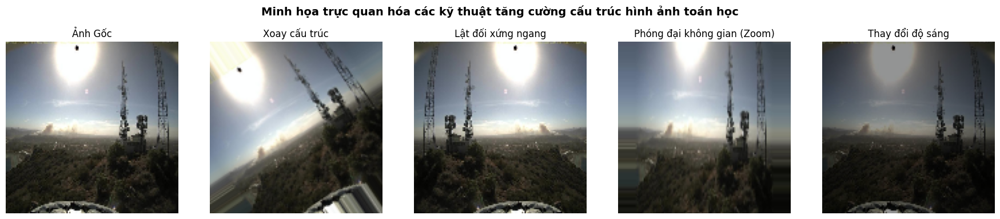

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/7_tsne_clustering.png


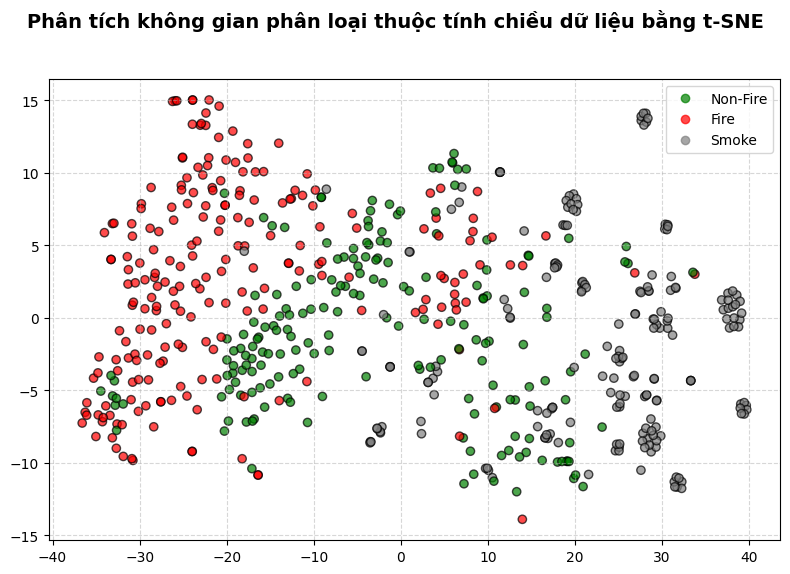

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/8_hsv_space_analysis.png


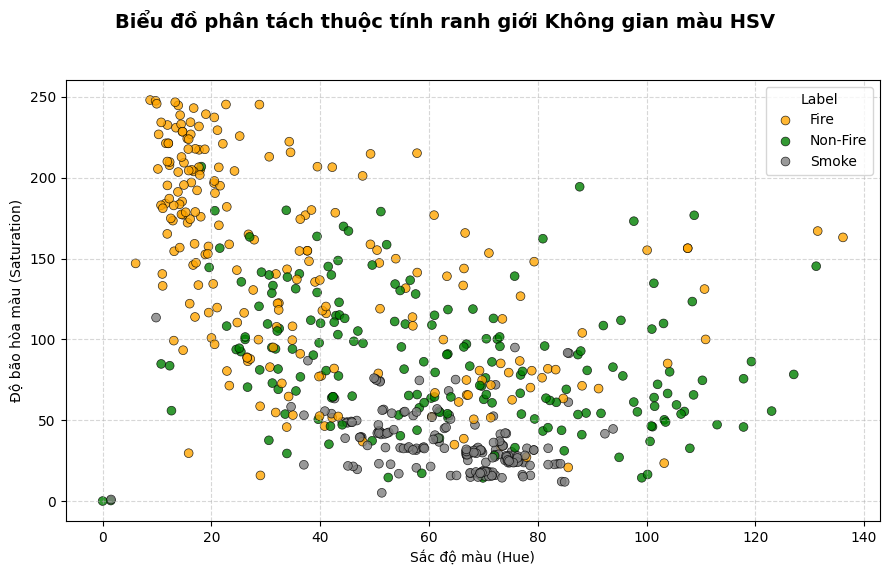

-> Đã lưu biểu đồ phân tích EDA: /content/drive/MyDrive/Do_an_co_so/KQ_EDA/9_illumination_analysis.png


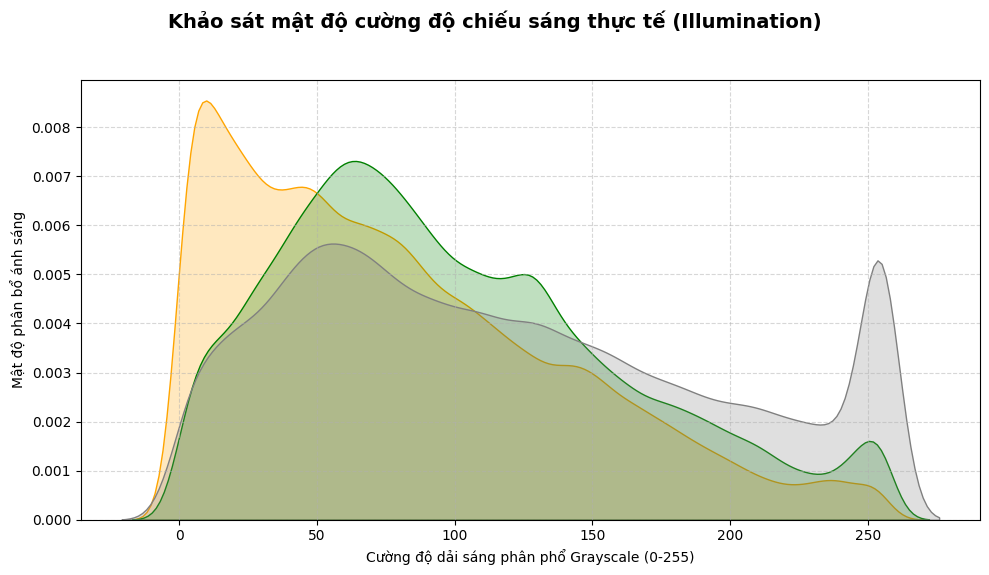

[+] Hoàn thành toàn diện quá trình phân tích thông số EDA.


In [ ]:
import cv2
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

SAVE_DIR = "/content/drive/MyDrive/Do_an_co_so/KQ_EDA"

def save_plot(filename, title):
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    full_path = os.path.join(SAVE_DIR, filename)
    plt.savefig(full_path, bbox_inches='tight', dpi=150)
    print(f"-> Đã lưu biểu đồ phân tích EDA: {full_path}")
    plt.show()
    plt.close()

def _safe_sample(df_, n):
    return df_.sample(n=min(n, len(df_)), random_state=42) if df_ is not None else None

# --- 1. Phân bố Lớp: So sánh số lượng trước và sau khi lọc dữ liệu ảnh ---
def plot_class_balance(df_before, df_after):
    labels = ['Fire', 'Non-Fire', 'Smoke']
    counts_before = df_before['label'].value_counts()
    counts_after = df_after['label'].value_counts()
    before_vals = [counts_before.get(l, 0) for l in labels]
    after_vals = [counts_after.get(l, 0) for l in labels]
    x = np.arange(len(labels))
    width = 0.35
    plt.figure(figsize=(10, 6))
    bars_before = plt.bar(x - width/2, before_vals, width, label='Trước khi lọc', color='#ff9999', edgecolor='black')
    bars_after = plt.bar(x + width/2, after_vals, width, label='Sau khi lọc', color='#66b3ff', edgecolor='black')

    def autolabel(rects, total):
        for rect in rects:
            h = rect.get_height()
            plt.text(rect.get_x() + rect.get_width()/2., h + 10, f'{int(h)}\n({h/total:.1%})', ha='center', va='bottom', fontsize=9, fontweight='bold')

    autolabel(bars_before, sum(before_vals))
    autolabel(bars_after, sum(after_vals))
    plt.ylabel("Số lượng ảnh")
    plt.xticks(x, labels, fontsize=12, fontweight='bold')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    save_plot("1_class_distribution_comparison.png", "Phân bố mẫu dữ liệu hình ảnh: Trước và Sau khi lọc")

# --- 2. Trích xuất đặc tính vật lý giữ nguyên nhãn ---
def run_physical_properties_analysis(df_):
    sampled_data = _safe_sample(df_, 1200)
    physical_props = []
    for _, row in sampled_data.iterrows():
        try:
            with Image.open(row['filepath']) as im:
                w, h = im.size
                physical_props.append({'Width (px)': w, 'Height (px)': h, 'Aspect Ratio': w/h, 'Label': row['label']})
        except:
            pass
    properties_df = pd.DataFrame(physical_props)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    sns.scatterplot(data=properties_df, x='Width (px)', y='Height (px)', hue='Label', palette={'Fire':'orange', 'Non-Fire':'green', 'Smoke':'gray'}, alpha=0.6, ax=axes[0])
    axes[0].axvline(128, color='red', linestyle='--')
    axes[0].axhline(128, color='red', linestyle='--')
    axes[0].set_title("a) Phân bổ không gian độ phân giải")
    sns.boxplot(data=properties_df, x='Label', y='Aspect Ratio', hue='Label', palette={'Fire':'orange', 'Non-Fire':'green', 'Smoke':'gray'}, width=0.5, ax=axes[1])
    axes[1].axhline(1.0, color='red', linestyle='--')
    axes[1].set_title("b) Tỷ lệ khung hình (Aspect Ratio)")
    save_plot("2_combined_physical_properties.png", "Khảo sát đặc tính vật lý hình ảnh gốc trong tập dữ liệu")

# --- 3. Biểu đồ Histogram cường độ Pixel (R, G, B) ---
def plot_rgb_histogram(df_):
    f_paths = _safe_sample(df_[df_['label'] == 'Fire'], 100)['filepath'].tolist()
    n_paths = _safe_sample(df_[df_['label'] == 'Non-Fire'], 100)['filepath'].tolist()
    s_paths = _safe_sample(df_[df_['label'] == 'Smoke'], 100)['filepath'].tolist()

    def get_channels(paths):
        r, g, b = [], [], []
        for p in paths:
            img = cv2.imread(p)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (64, 64))
                r.append(img[:,:,0].flatten()); g.append(img[:,:,1].flatten()); b.append(img[:,:,2].flatten())
        return np.concatenate(r), np.concatenate(g), np.concatenate(b)

    f_r, f_g, f_b = get_channels(f_paths)
    n_r, n_g, n_b = get_channels(n_paths)
    s_r, s_g, s_b = get_channels(s_paths)
    plt.figure(figsize=(18, 5))
    chans = [(f_r, n_r, s_r, 'Red Channel', 'red'), (f_g, n_g, s_g, 'Green Channel', 'green'), (f_b, n_b, s_b, 'Blue Channel', 'blue')]
    for i, (f_d, n_d, s_d, name, col) in enumerate(chans):
        plt.subplot(1, 3, i+1)
        plt.hist(f_d, bins=50, density=True, alpha=0.4, label='Fire', color='orange')
        plt.hist(n_d, bins=50, density=True, alpha=0.4, label='Non-Fire', color=col)
        plt.hist(s_d, bins=50, density=True, alpha=0.4, label='Smoke', color='gray')
        plt.title(name)
        plt.legend()
    save_plot("3_rgb_histograms.png", "Biểu đồ Histogram khảo sát cường độ phân bổ các dòng kênh màu RGB")

# --- 4. Biểu đồ cột giá trị Pixel trung bình tích hợp Error Bar (SỬA HẠT SẠN MEAN/STD) ---
def plot_pixel_mean_std(df_):
    f_paths = _safe_sample(df_[df_['label'] == 'Fire'], 100)['filepath'].tolist()
    n_paths = _safe_sample(df_[df_['label'] == 'Non-Fire'], 100)['filepath'].tolist()
    s_paths = _safe_sample(df_[df_['label'] == 'Smoke'], 100)['filepath'].tolist()

    def get_channels(paths):
        r, g, b = [], [], []
        for p in paths:
            img = cv2.imread(p)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (64, 64))
                r.append(img[:,:,0].flatten()); g.append(img[:,:,1].flatten()); b.append(img[:,:,2].flatten())
        return np.concatenate(r), np.concatenate(g), np.concatenate(b)

    f_r, f_g, f_b = get_channels(f_paths)
    n_r, n_g, n_b = get_channels(n_paths)
    s_r, s_g, s_b = get_channels(s_paths)

    means = [np.mean(f_r), np.mean(n_r), np.mean(s_r), np.mean(f_g), np.mean(n_g), np.mean(s_g), np.mean(f_b), np.mean(n_b), np.mean(s_b)]
    stds = [np.std(f_r), np.std(n_r), np.std(s_r), np.std(f_g), np.std(n_g), np.std(s_g), np.std(f_b), np.std(n_b), np.std(s_b)]

    labels = ['Fire (R)', 'Non-Fire (R)', 'Smoke (R)', 'Fire (G)', 'Non-Fire (G)', 'Smoke (G)', 'Fire (B)', 'Non-Fire (B)', 'Smoke (B)']
    colors = ['#ff9999', '#ff4d4d', '#cccccc', '#99ff99', '#33cc33', '#999999', '#99ccff', '#3385ff', '#666666']

    plt.figure(figsize=(12, 6))
    bars = plt.bar(labels, means, yerr=stds, capsize=5, color=colors, edgecolor='black', alpha=0.8)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f'{yval:.1f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
    plt.ylabel("Cường độ dòng ảnh (0-255)")
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    save_plot("4_pixel_mean_std.png", "Biểu đồ cột tích hợp Mean và Độ lệch chuẩn (Standard Deviation) kiểm định sai số")

# --- 5. Lưới Ảnh Ngẫu nhiên 5x5 theo từng lớp ---
def plot_random_grid(df_, label_name):
    subset = df_[df_['label'] == label_name]
    sample_df = _safe_sample(subset, 25)
    plt.figure(figsize=(12, 12))
    for i, (_, row) in enumerate(sample_df.iterrows()):
        ax = plt.subplot(5, 5, i+1)
        img = cv2.imread(row['filepath'])
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
        ax.axis('off')
    save_plot(f"5_random_grid_{label_name.lower()}.png", f"Lưới trực quan ma trận ảnh ngẫu nhiên 5x5 phân lớp {label_name}")

# --- 6. Trực quan hóa Tăng cường Dữ liệu (Data Augmentation) ---
def plot_augmentation_sample(df_):
    from tensorflow.keras.preprocessing.image import ImageDataGenerator
    sample_path = df_.sample(n=1)['filepath'].iloc[0]
    img = cv2.imread(sample_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (128, 128))
    img_input = np.expand_dims(img, 0)
    datagen_rot = ImageDataGenerator(rotation_range=45, fill_mode='nearest')
    datagen_zoom = ImageDataGenerator(zoom_range=0.3, fill_mode='nearest')
    datagen_bright = ImageDataGenerator(brightness_range=[0.5, 1.5], fill_mode='nearest')

    imgs = [
        img,
        next(datagen_rot.flow(img_input, batch_size=1))[0].astype('uint8'),
        cv2.flip(img, 1),
        next(datagen_zoom.flow(img_input, batch_size=1))[0].astype('uint8'),
        next(datagen_bright.flow(img_input, batch_size=1))[0].astype('uint8')
    ]
    titles = ["Ảnh Gốc", "Xoay cấu trúc", "Lật đối xứng ngang", "Phóng đại không gian (Zoom)", "Thay đổi độ sáng"]
    plt.figure(figsize=(18, 4))
    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.imshow(imgs[i])
        plt.title(titles[i])
        plt.axis('off')
    save_plot("6_data_augmentation_examples.png", "Minh họa trực quan hóa các kỹ thuật tăng cường cấu trúc hình ảnh toán học")

# --- 7. Phân tích T-SNE / Giảm chiều dữ liệu không gian đặc trưng ---
def plot_tsne_clustering(df_):
    sample_df = _safe_sample(df_, 600)
    X, y = [], []
    for _, row in sample_df.iterrows():
        img = cv2.imread(row['filepath'])
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (45, 45))
            X.append(img.flatten())
            y.append(1 if row['label'] == 'Fire' else (2 if row['label'] == 'Smoke' else 0))
    X, y = np.array(X) / 255.0, np.array(y)
    X_pca = PCA(n_components=30).fit_transform(X)
    X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_pca)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap=ListedColormap(['green', 'red', 'gray']), alpha=0.7, edgecolor='k')
    plt.legend(handles=scatter.legend_elements()[0], labels=['Non-Fire', 'Fire', 'Smoke'])
    plt.grid(True, linestyle='--', alpha=0.5)
    save_plot("7_tsne_clustering.png", "Phân tích không gian phân loại thuộc tính chiều dữ liệu bằng t-SNE")

# --- 8. Phân tích sâu Không gian màu HSV ---
def plot_hsv_analysis(df_):
    sampled_data = _safe_sample(df_, 600)
    hsv_data = []
    for _, row in sampled_data.iterrows():
        try:
            img = cv2.imread(row['filepath'])
            if img is not None:
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
                h_mean = np.mean(img_hsv[:,:,0])
                s_mean = np.mean(img_hsv[:,:,1])
                hsv_data.append({'Hue': h_mean, 'Saturation': s_mean, 'Label': row['label']})
        except:
            pass
    hsv_df = pd.DataFrame(hsv_data)
    plt.figure(figsize=(9, 6))
    sns.scatterplot(data=hsv_df, x='Hue', y='Saturation', hue='Label', palette={'Fire':'orange', 'Non-Fire':'green', 'Smoke':'gray'}, alpha=0.8, s=40, edgecolor='black')
    plt.xlabel('Sắc độ màu (Hue)')
    plt.ylabel('Độ bão hòa màu (Saturation)')
    plt.grid(True, linestyle='--', alpha=0.5)
    save_plot("8_hsv_space_analysis.png", "Biểu đồ phân tách thuộc tính ranh giới Không gian màu HSV")

# --- 9. Phân tích cường độ sáng Grayscale (Ngày/Đêm) ---
def plot_illumination_analysis(df_):
    sampled_data = _safe_sample(df_, 450)
    plt.figure(figsize=(10, 6))
    for lbl, col in [('Fire', 'orange'), ('Non-Fire', 'green'), ('Smoke', 'gray')]:
        paths = sampled_data[sampled_data['label'] == lbl]['filepath'].tolist()
        gray_vals = []
        for p in paths:
            img = cv2.imread(p)
            if img is not None:
                img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                gray_vals.append(cv2.resize(img_gray, (32, 32)).flatten())
        if gray_vals:
            sns.kdeplot(np.concatenate(gray_vals), color=col, label=lbl, fill=True, alpha=0.25)
    plt.xlabel("Cường độ dải sáng phân phổ Grayscale (0-255)")
    plt.ylabel("Mật độ phân bổ ánh sáng")
    plt.grid(True, linestyle='--', alpha=0.5)
    save_plot("9_illumination_analysis.png", "Khảo sát mật độ cường độ chiếu sáng thực tế (Illumination)")

# Khối kích hoạt vẽ toàn bộ hệ thống phân tích EDA.
print("[---] Khởi chạy hệ thống tự động tạo đồ thị phân tích dữ liệu chuyên nghiệp...")
plot_class_balance(df, train_df)
run_physical_properties_analysis(df)
plot_rgb_histogram(train_df)
plot_pixel_mean_std(train_df)
for label in ['Fire', 'Non-Fire', 'Smoke']:
    plot_random_grid(train_df, label)
plot_augmentation_sample(train_df)
plot_tsne_clustering(train_df)
plot_hsv_analysis(train_df)
plot_illumination_analysis(train_df)
print("[+] Hoàn thành toàn diện quá trình phân tích thông số EDA.")

## 5: XÂY DỰNG MÔ HÌNH HUẤN LUYỆN CNN

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Thiết kế mạng tích chập CNN lõi phẳng tối ưu hóa tốc độ học (Không dùng MobileNet cấu trúc phức tạp)
def build_model(learning_rate=0.001, dropout_rate=0.5):
    model = Sequential([
        # Khối ánh xạ dải giá trị chuẩn hình ảnh đầu vào trực tiếp trong mô hình mạng
        tf.keras.layers.Input(shape=(128, 128, 3)),
        tf.keras.layers.Rescaling(1./255),

        # Khối tích chập 1
        Conv2D(32, (3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # Khối tích chập 2
        Conv2D(64, (3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # Khối tích chập 3
        Conv2D(128, (3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # Khối tích chập 4 tăng cường tính năng trích xuất
        Conv2D(256, (3, 3), padding='same'),
        BatchNormalization(),
        Activation('relu'),

        GlobalAveragePooling2D(),

        # Lớp phân loại kết nối đầy đủ chuyên sâu
        Dense(128, activation='relu'),
        Dropout(dropout_rate),
        Dense(3, activation='softmax')
    ])
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Khởi tạo kiểm thử cấu trúc mạng CNN trích xuất cục bộ
test_model = build_model()
test_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 423,619 (1.62 MB)

 Trainable params: 422,659 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

## 6: TỐI ƯU HÓA SIÊU THAM SỐ (HYPERPARAMETER TUNING) VÀ HUẤN LUYỆN MÔ HÌNH

In [ ]:
import itertools
import time
from tensorflow.keras.callbacks import EarlyStopping

# Thiết lập cấu hình vòng lặp tìm kiếm lưới siêu tham số toán học tối ưu
EPOCHS = 20
learning_rates = [0.001, 0.0001]
dropout_rates = [0.3, 0.5]

best_val_accuracy = 0.0
best_hyperparams = {}
best_model_overall = None
best_history = None
all_tuning_results = []

start_tuning_time = time.time()
print("--- KHỞI CHẠY QUÁ TRÌNH GRID SEARCH TỐI ƯU HÓA SIÊU THAM SỐ TOÀN DIỆN VÀ HUẤN LUYỆN ---")

for lr, dr in itertools.product(learning_rates, dropout_rates):
    print(f"\n{'-'*60}\nThử nghiệm cấu hình: Learning Rate = {lr} | Dropout Rate = {dr}\n{'-'*60}")

    current_model = build_model(learning_rate=lr, dropout_rate=dr)

    # Callback dừng sớm nếu Validation Loss không cải thiện sau 3 epoch liên tiếp nhằm tránh hiện tượng Overfitting
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    current_history = current_model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=EPOCHS,
        callbacks=[early_stopping]
    )

    max_val_acc = max(current_history.history['val_accuracy'])
    print(f"[+] Độ chính xác Validation tối đa cấu hình này đạt được: {max_val_acc:.4f}")

    all_tuning_results.append({'lr': lr, 'dr': dr, 'history': current_history})

    # Lưu vết lưu giữ mô hình tối ưu tuyệt đối có độ chính xác cao nhất phục vụ chấm điểm đồ án
    if max_val_acc > best_val_accuracy:
        best_val_accuracy = max_val_acc
        best_hyperparams = {'learning_rate': lr, 'dropout_rate': dr}
        best_model_overall = current_model
        best_history = current_history
        current_model.save('/content/drive/MyDrive/Do_an_co_so/Model/best_forest_fire_model.h5')
        print(" -> [!] Đã cập nhật tệp tin kiến trúc mô hình tối ưu mới hệ thống lưu trên Drive.")

# Đồng bộ hóa tham số lõi mô hình đích ra biến toàn cục phục vụ các module ứng dụng phía sau
model = best_model_overall
history = best_history
model.save('/content/drive/MyDrive/Do_an_co_so/Model/fire_detection_model.h5')

total_tuning_time = time.time() - start_tuning_time
hours, rem = divmod(total_tuning_time, 3600)
minutes, seconds = divmod(rem, 60)
print(f"\n[+] TỔNG THỜI GIAN HUẤN LUYỆN GRID SEARCH HỆ THỐNG: {int(hours):02d} giờ {int(minutes):02d} phút {seconds:.2f} giây")

--- KHỞI CHẠY QUÁ TRÌNH GRID SEARCH TỐI ƯU HÓA SIÊU THAM SỐ TOÀN DIỆN VÀ HUẤN LUYỆN ---

------------------------------------------------------------
Thử nghiệm cấu hình: Learning Rate = 0.001 | Dropout Rate = 0.3
------------------------------------------------------------
Epoch 1/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 284s 601ms/step - accuracy: 0.9048 - loss: 0.2727 - val_accuracy: 0.8439 - val_loss: 0.4088
Epoch 2/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 272s 604ms/step - accuracy: 0.9439 - loss: 0.1735 - val_accuracy: 0.8277 - val_loss: 0.7237
Epoch 3/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 265s 588ms/step - accuracy: 0.9492 - loss: 0.1583 - val_accuracy: 0.8661 - val_loss: 0.4360
Epoch 4/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 269s 598ms/step - accuracy: 0.9536 - loss: 0.1437 - val_accuracy: 0.8788 - val_loss: 0.5700


[+] Độ chính xác Validation tối đa cấu hình này đạt được: 0.8788
 -> [!] Đã cập nhật tệp tin kiến trúc mô hình tối ưu mới hệ thống lưu trên Drive.

------------------------------------------------------------
Thử nghiệm cấu hình: Learning Rate = 0.001 | Dropout Rate = 0.5
------------------------------------------------------------
Epoch 1/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 272s 583ms/step - accuracy: 0.8960 - loss: 0.2916 - val_accuracy: 0.9028 - val_loss: 0.2564
Epoch 2/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 264s 586ms/step - accuracy: 0.9378 - loss: 0.1933 - val_accuracy: 0.8278 - val_loss: 0.6394
Epoch 3/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 274s 609ms/step - accuracy: 0.9471 - loss: 0.1669 - val_accuracy: 0.9249 - val_loss: 0.2409
Epoch 4/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 275s 609ms/step - accuracy: 0.9514 - loss: 0.1550 - val_accuracy: 0.8012 - val_loss: 1.0459
Epoch 5/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 273s 606ms/step - accuracy: 0.9524 - loss: 0.1513 - val_accuracy: 0.9241 - val_loss: 0.2314
Epoch 

[+] Độ chính xác Validation tối đa cấu hình này đạt được: 0.9591
 -> [!] Đã cập nhật tệp tin kiến trúc mô hình tối ưu mới hệ thống lưu trên Drive.

------------------------------------------------------------
Thử nghiệm cấu hình: Learning Rate = 0.0001 | Dropout Rate = 0.3
------------------------------------------------------------
Epoch 1/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 263s 563ms/step - accuracy: 0.8784 - loss: 0.3379 - val_accuracy: 0.8241 - val_loss: 0.4085
Epoch 2/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 268s 595ms/step - accuracy: 0.9292 - loss: 0.2112 - val_accuracy: 0.8327 - val_loss: 0.4628
Epoch 3/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 269s 598ms/step - accuracy: 0.9411 - loss: 0.1789 - val_accuracy: 0.6909 - val_loss: 1.4571
Epoch 4/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 269s 597ms/step - accuracy: 0.9465 - loss: 0.1650 - val_accuracy: 0.8704 - val_loss: 0.3807
Epoch 5/20
450/450 ━━━━━━━━━━━━━━━━━━━━ 269s 597ms/step - accuracy: 0.9511 - loss: 0.1511 - val_accuracy: 0.7921 - val_loss: 0.7507
Epoch

[+] Độ chính xác Validation tối đa cấu hình này đạt được: 0.9020

[+] TỔNG THỜI GIAN HUẤN LUYỆN GRID SEARCH HỆ THỐNG: 02 giờ 26 phút 18.52 giây


## 7: TỔNG KẾT VÀ TRỰC QUAN HÓA KẾT QUẢ TỐI ƯU HÓA SIÊU THAM SỐ

[---] TỔNG KẾT BẢNG KẾT QUẢ QUÁ TRÌNH DUYỆT SIÊU THAM SỐ MODEL ---
Cấu hình 1: LR=0.001, Dropout=0.3 -> Best Val Acc=0.8788
Cấu hình 2: LR=0.001, Dropout=0.5 -> Best Val Acc=0.9591
Cấu hình 3: LR=0.0001, Dropout=0.3 -> Best Val Acc=0.9370
Cấu hình 4: LR=0.0001, Dropout=0.5 -> Best Val Acc=0.9020


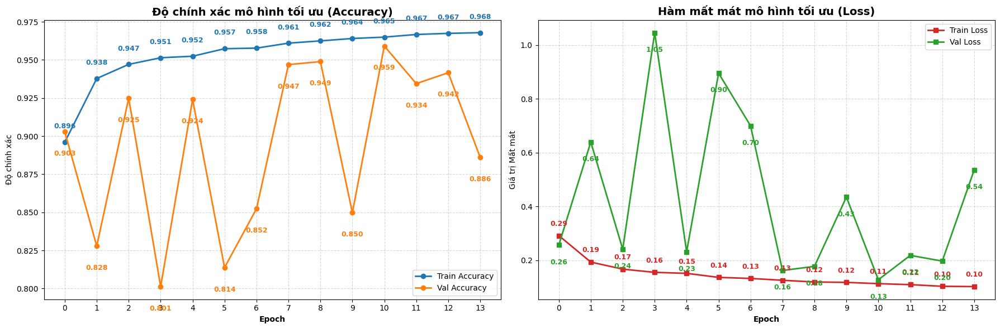

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

print("[---] TỔNG KẾT BẢNG KẾT QUẢ QUÁ TRÌNH DUYỆT SIÊU THAM SỐ MODEL ---")
tuning_summary = []
for idx, res in enumerate(all_tuning_results):
    hist = res['history'].history
    tuning_summary.append({
        'Config_ID': idx + 1,
        'Learning_Rate': res['lr'],
        'Dropout_Rate': res['dr'],
        'Final_Train_Acc': hist['accuracy'][-1],
        'Best_Val_Acc': max(hist['val_accuracy']),
        'Final_Val_Loss': hist['val_loss'][-1]
    })

summary_df = pd.DataFrame(tuning_summary)
summary_df.to_csv('/content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/hyperparameter_tuning_summary.csv', index=False)

# Hiển thị tường minh kết quả phân tích cấu hình siêu tham số dạng text Python
for _, r in summary_df.iterrows():
    print(f"Cấu hình {int(r['Config_ID'])}: LR={r['Learning_Rate']}, Dropout={r['Dropout_Rate']} -> Best Val Acc={r['Best_Val_Acc']:.4f}")

# Vẽ đồ thị đường cong học tập động lực học (Learning Curves) của cấu hình mạng CNN xuất sắc nhất
plt.figure(figsize=(18, 6)) # Tăng chiều rộng để các con số không bị đè lên nhau

# Lấy dữ liệu từ lịch sử huấn luyện
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

# --- 1. Biểu đồ Accuracy (Độ chính xác) ---
plt.subplot(1, 2, 1)
# Vẽ đường kết hợp điểm (marker)
plt.plot(epochs, acc, label='Train Accuracy', color='#1f77b4', linewidth=2, marker='o', markersize=6)
plt.plot(epochs, val_acc, label='Val Accuracy', color='#ff7f0e', linewidth=2, marker='o', markersize=6)

# Vòng lặp hiển thị giá trị số học lên từng điểm
for i in epochs:
    plt.text(i, acc[i] + 0.008, f'{acc[i]:.3f}', ha='center', va='bottom', fontsize=9, color='#1f77b4', fontweight='bold')
    plt.text(i, val_acc[i] - 0.012, f'{val_acc[i]:.3f}', ha='center', va='top', fontsize=9, color='#ff7f0e', fontweight='bold')

plt.title('Độ chính xác mô hình tối ưu (Accuracy)', fontweight='bold', fontsize=14)
plt.xlabel('Epoch', fontweight='bold')
plt.ylabel('Độ chính xác')
plt.xticks(epochs) # Ép hiển thị rõ từng vạch epoch 0, 1, 2...
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# --- 2. Biểu đồ Loss (Hàm mất mát) ---
plt.subplot(1, 2, 2)
# Vẽ đường kết hợp điểm (marker hình vuông 's')
plt.plot(epochs, loss, label='Train Loss', color='#d62728', linewidth=2, marker='s', markersize=6)
plt.plot(epochs, val_loss, label='Val Loss', color='#2ca02c', linewidth=2, marker='s', markersize=6)

# Vòng lặp hiển thị giá trị số học lên từng điểm
for i in epochs:
    plt.text(i, loss[i] + 0.03, f'{loss[i]:.2f}', ha='center', va='bottom', fontsize=9, color='#d62728', fontweight='bold')
    plt.text(i, val_loss[i] - 0.05, f'{val_loss[i]:.2f}', ha='center', va='top', fontsize=9, color='#2ca02c', fontweight='bold')

plt.title('Hàm mất mát mô hình tối ưu (Loss)', fontweight='bold', fontsize=14)
plt.xlabel('Epoch', fontweight='bold')
plt.ylabel('Giá trị Mất mát')
plt.xticks(epochs) # Ép hiển thị rõ từng vạch epoch
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/best_model_learning_curves.png', dpi=300)
plt.show()

## 8: ĐÁNH GIÁ TOÀN DIỆN HIỆU SUẤT MÔ HÌNH TRÊN TẬP KIỂM TRA (TEST SET)


--- BIỂU ĐỒ QUÁ TRÌNH HUẤN LUYỆN & ĐÁNH GIÁ CHO MÔ HÌNH XUẤT SẮC NHẤT ---
97/97 ━━━━━━━━━━━━━━━━━━━━ 34s 328ms/step

--- Tiến hành vẽ các biểu đồ kiểm định chỉ số hiệu suất phân loại ---
[+] Đã lưu biểu đồ đánh giá: /content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/evaluation_confusion_matrix.png


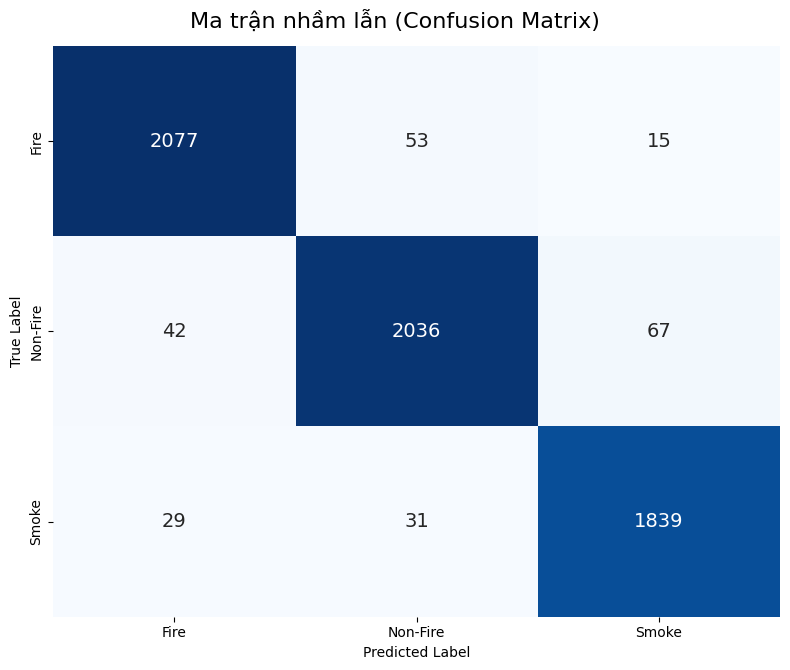

[+] Đã lưu biểu đồ đánh giá: /content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/evaluation_roc_curve.png


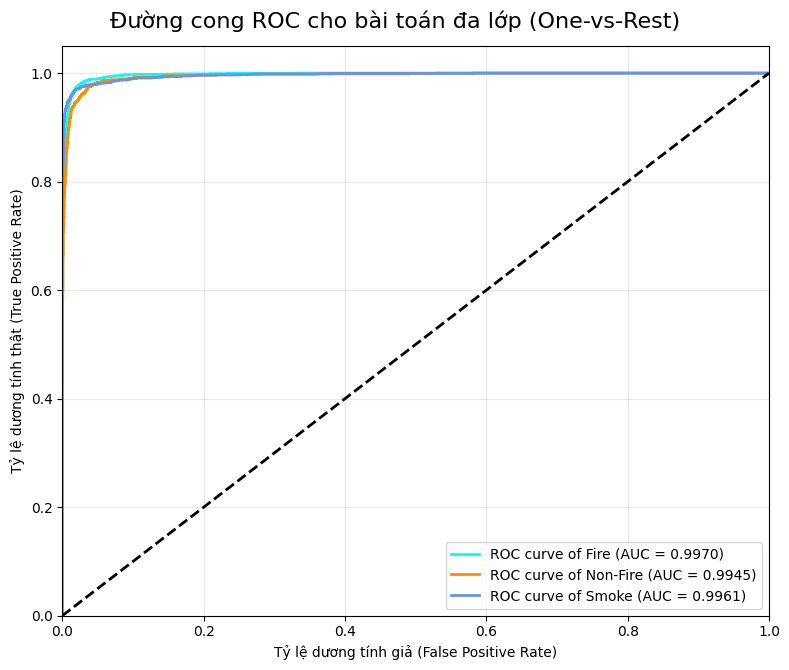

[+] Đã lưu biểu đồ đánh giá: /content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/evaluation_precision_recall_curve.png


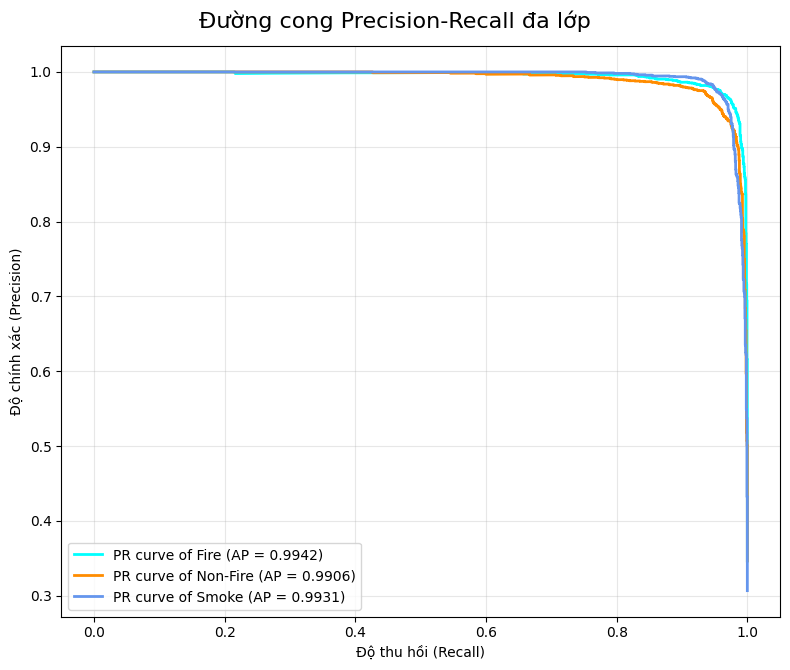


Báo cáo phân loại chi tiết hiệu suất thuật toán (Classification Report):
              precision    recall  f1-score   support

        Fire       0.97      0.97      0.97      2145
    Non-Fire       0.96      0.95      0.95      2145
       Smoke       0.96      0.97      0.96      1899

    accuracy                           0.96      6189
   macro avg       0.96      0.96      0.96      6189
weighted avg       0.96      0.96      0.96      6189

[+] Đã lưu biểu đồ đánh giá: /content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/evaluation_calibration_plot.png


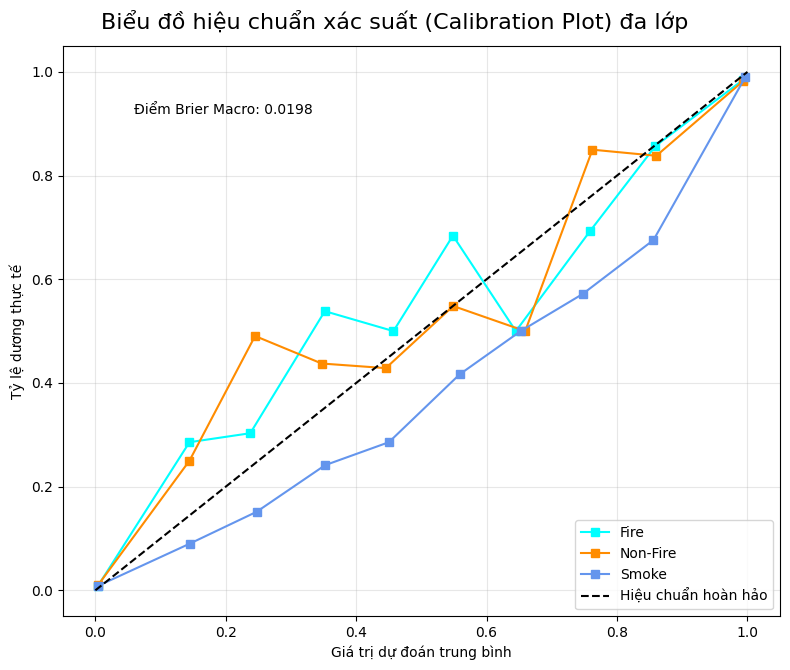

[+] Đã lưu biểu đồ đánh giá: /content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen/evaluation_threshold_sweep.png


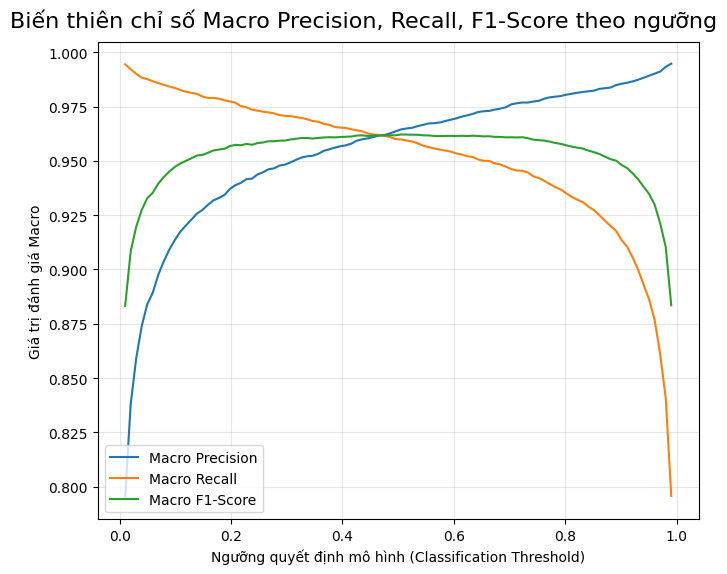

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, classification_report, brier_score_loss, precision_recall_fscore_support
from sklearn.calibration import calibration_curve
import os

SAVE_DIR_EVALUATION = "/content/drive/MyDrive/Do_an_co_so/KQ_Huan_Luyen"

def save_evaluation_plot_as_png(filename, plot_title):
    full_path = os.path.join(SAVE_DIR_EVALUATION, filename)
    plt.suptitle(plot_title, fontsize=16)
    plt.savefig(full_path, bbox_inches='tight', dpi=300)
    print(f"[+] Đã lưu biểu đồ đánh giá: {full_path}")
    plt.show()
    plt.close()

print("\n" + "="*80)
print("--- BIỂU ĐỒ QUÁ TRÌNH HUẤN LUYỆN & ĐÁNH GIÁ CHO MÔ HÌNH XUẤT SẮC NHẤT ---")
print("="*80)

def evaluate_model_comprehensive(model, test_ds):
    # Lấy nhãn thực tế từ Dataset pipeline tuần tự
    y_true = np.concatenate([y.numpy() for _, y in test_ds], axis=0)
    y_true_labels = np.argmax(y_true, axis=1) # Chuyển đổi từ dạng One-Hot về nhãn gốc kiểu số nguyên

    # Thực hiện dự đoán xác suất đa lớp trực tiếp
    predictions = model.predict(test_ds, verbose=1)
    y_pred_label = np.argmax(predictions, axis=1)

    # SỬA LỖI GỐC: Định nghĩa tường minh n_classes và binarize nhãn phục vụ biểu đồ ROC/PR đa lớp
    n_classes = 3
    class_names = ['Fire', 'Non-Fire', 'Smoke']
    Y_true_bin = tf.keras.utils.to_categorical(y_true_labels, num_classes=n_classes)

    print("\n--- Tiến hành vẽ các biểu đồ kiểm định chỉ số hiệu suất phân loại ---")

    # 1. Ma trận nhầm lẫn (Confusion Matrix)
    plt.figure(figsize=(8, 7))
    cm = confusion_matrix(y_true_labels, y_pred_label)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names, annot_kws={"size": 14})
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    save_evaluation_plot_as_png("evaluation_confusion_matrix.png", 'Ma trận nhầm lẫn (Confusion Matrix)')

    # 2. Đường cong ROC đa lớp theo chiến lược (One-vs-Rest)
    plt.figure(figsize=(8, 7))
    colors = ['aqua', 'darkorange', 'cornflowerblue']
    for i, color in zip(range(n_classes), colors):
        fpr, tpr, _ = roc_curve(Y_true_bin[:, i], predictions[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color=color, lw=2, label=f'ROC curve of {class_names[i]} (AUC = {roc_auc:0.4f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tỷ lệ dương tính giả (False Positive Rate)')
    plt.ylabel('Tỷ lệ dương tính thật (True Positive Rate)')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    save_evaluation_plot_as_png("evaluation_roc_curve.png", 'Đường cong ROC cho bài toán đa lớp (One-vs-Rest)')

    # 3. Đường cong Precision-Recall đa lớp bảo vệ thuật toán mẫu
    plt.figure(figsize=(8, 7))
    for i, color in zip(range(n_classes), colors):
        precision, recall, _ = precision_recall_curve(Y_true_bin[:, i], predictions[:, i])
        avg_precision = average_precision_score(Y_true_bin[:, i], predictions[:, i])
        plt.plot(recall, precision, color=color, lw=2, label=f'PR curve of {class_names[i]} (AP = {avg_precision:0.4f})')
    plt.xlabel('Độ thu hồi (Recall)')
    plt.ylabel('Độ chính xác (Precision)')
    plt.legend(loc="lower left")
    plt.grid(True, alpha=0.3)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    save_evaluation_plot_as_png("evaluation_precision_recall_curve.png", 'Đường cong Precision-Recall đa lớp')

    # In báo cáo phân loại chi tiết dạng văn bản khoa học cho hội đồng xem xét
    print("\nBáo cáo phân loại chi tiết hiệu suất thuật toán (Classification Report):")
    print(classification_report(y_true_labels, y_pred_label, target_names=class_names))

    # 4. Biểu đồ xác thực hiệu chuẩn đầu ra (Calibration Plot) và điểm số Brier Score
    plt.figure(figsize=(8, 7))
    avg_brier = 0
    for i, color in zip(range(n_classes), colors):
        fraction_of_positives, mean_predicted_value = calibration_curve(Y_true_bin[:, i], predictions[:, i], n_bins=10)
        plt.plot(mean_predicted_value, fraction_of_positives, 's-', label=f'{class_names[i]}', color=color)
        avg_brier += brier_score_loss(Y_true_bin[:, i], predictions[:, i])
    avg_brier /= n_classes
    plt.plot([0, 1], [0, 1], 'k--', label='Hiệu chuẩn hoàn hảo')
    plt.xlabel('Giá trị dự đoán trung bình')
    plt.ylabel('Tỷ lệ dương thực tế')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.text(0.1, 0.9, f'Điểm Brier Macro: {avg_brier:.4f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    save_evaluation_plot_as_png("evaluation_calibration_plot.png", 'Biểu đồ hiệu chuẩn xác suất (Calibration Plot) đa lớp')

    # 5. Phân tích quét ngưỡng phân loại tối ưu (Threshold Sweep Plot)
    plt.figure(figsize=(7, 6))
    thresholds = np.linspace(0.01, 0.99, 100)
    precisions, recalls, f1_scores = [], [], []
    for t in thresholds:
        y_pred_at_t = (predictions > t).astype(int)
        p, r, f1, _ = precision_recall_fscore_support(Y_true_bin, y_pred_at_t, average='macro', zero_division=0)
        precisions.append(p); recalls.append(r); f1_scores.append(f1)
    plt.plot(thresholds, precisions, label='Macro Precision')
    plt.plot(thresholds, recalls, label='Macro Recall')
    plt.plot(thresholds, f1_scores, label='Macro F1-Score')
    plt.xlabel('Ngưỡng quyết định mô hình (Classification Threshold)')
    plt.ylabel('Giá trị đánh giá Macro')
    plt.legend(loc='lower left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    save_evaluation_plot_as_png("evaluation_threshold_sweep.png", 'Biến thiên chỉ số Macro Precision, Recall, F1-Score theo ngưỡng')

if 'model' in globals() and model is not None:
    evaluate_model_comprehensive(model, test_dataset)
else:
    print("[!] Lỗi hệ thống: Không tìm thấy thực thể mô hình trong bộ nhớ máy ảo.")
print("\n" + "="*80)

## 9: GIẢI THÍCH MÔ HÌNH (XAI) BẰNG GRAD-CAM VÀ BẢN ĐỒ ĐẶC TRƯNG



[+] Mô hình tải thành công phục vụ phân tích thuật toán giải thích mô hình XAI.
--- KHỞI ĐỘNG MODULE GIẢI THÍCH MÔ HÌNH HỌC SÂU MẠNG TÍCH CHẬP (XAI) ---
[+] Lớp tích chập cuối cùng được lựa chọn tự động: conv2d_11
[+] Lựa chọn ngẫu nhiên ảnh kiểm định trực quan XAI nhãn mẫu thực tế (Smoke): /root/.cache/kagglehub/datasets/amerzishminha/forest-fire-smoke-and-non-fire-image-dataset/versions/3/FOREST_FIRE_SMOKE_AND_NON_FIRE_DATASET/test/Smoke/Smoke (383).jpg
[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_gradcam_comparison.png


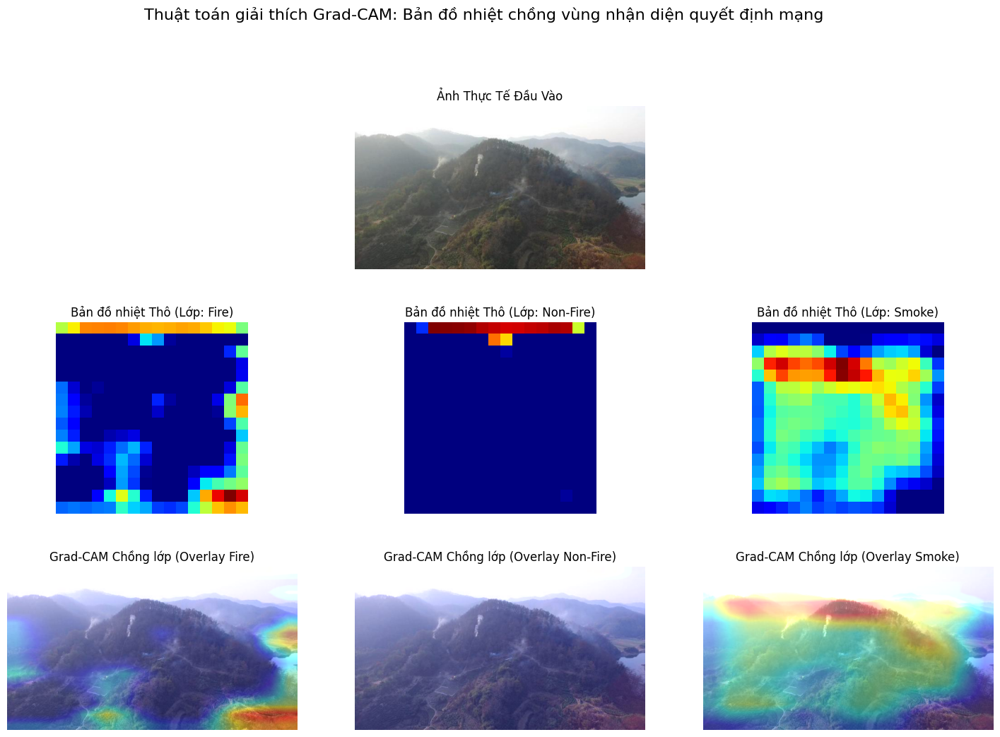

[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_first_layer_filters.png


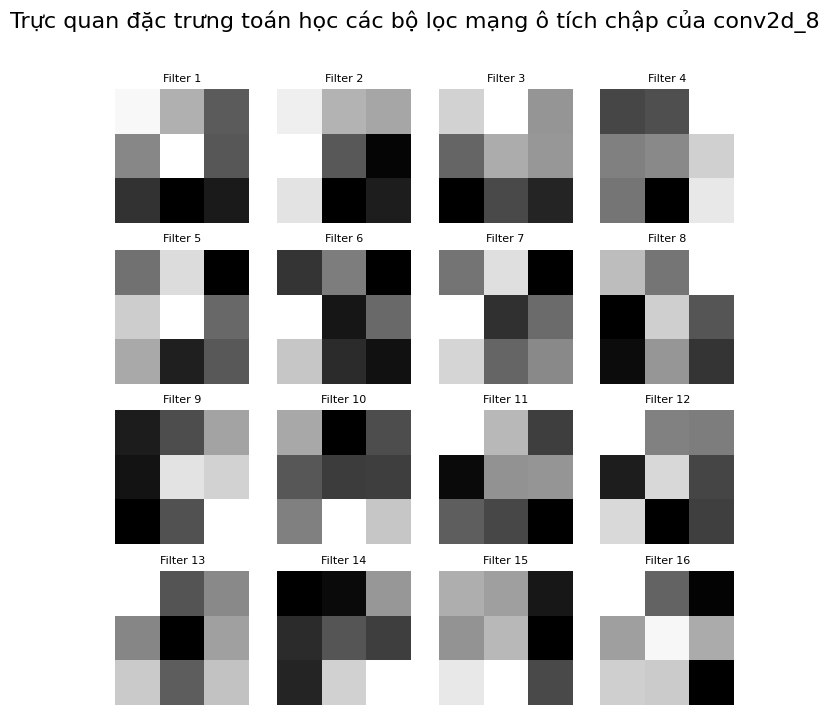

[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_feature_maps_conv2d_8.png


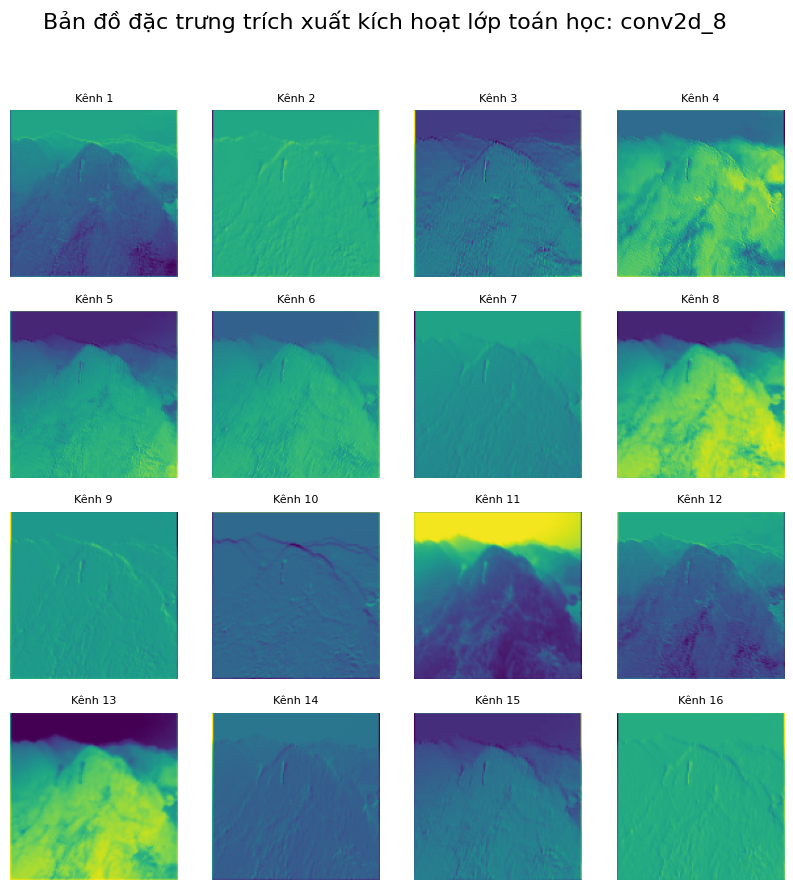

[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_feature_maps_conv2d_9.png


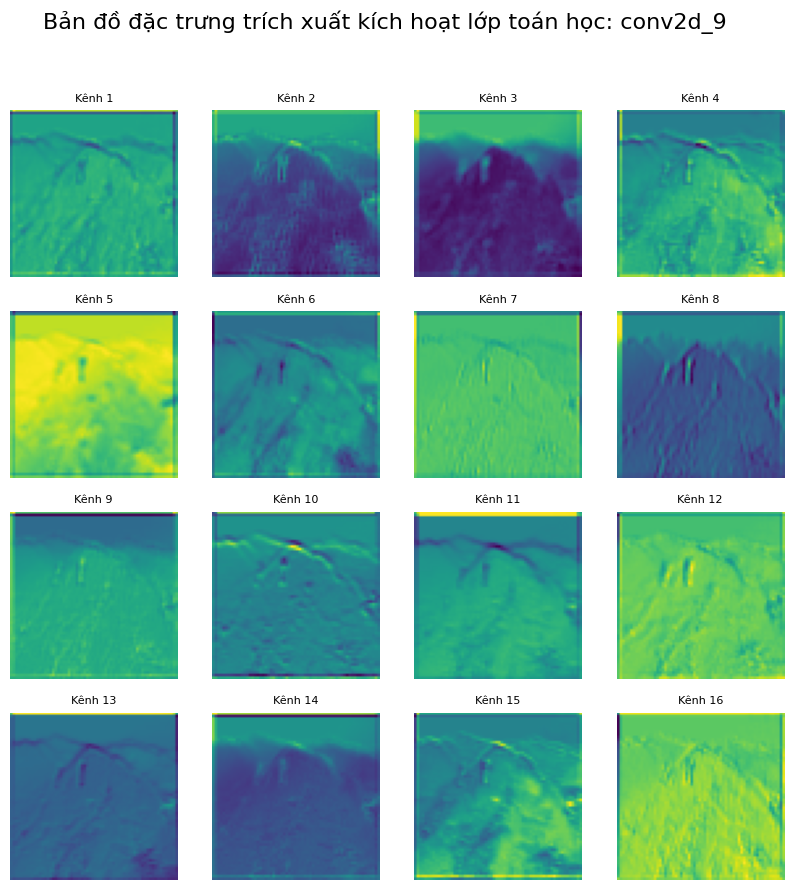

[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_feature_maps_conv2d_10.png


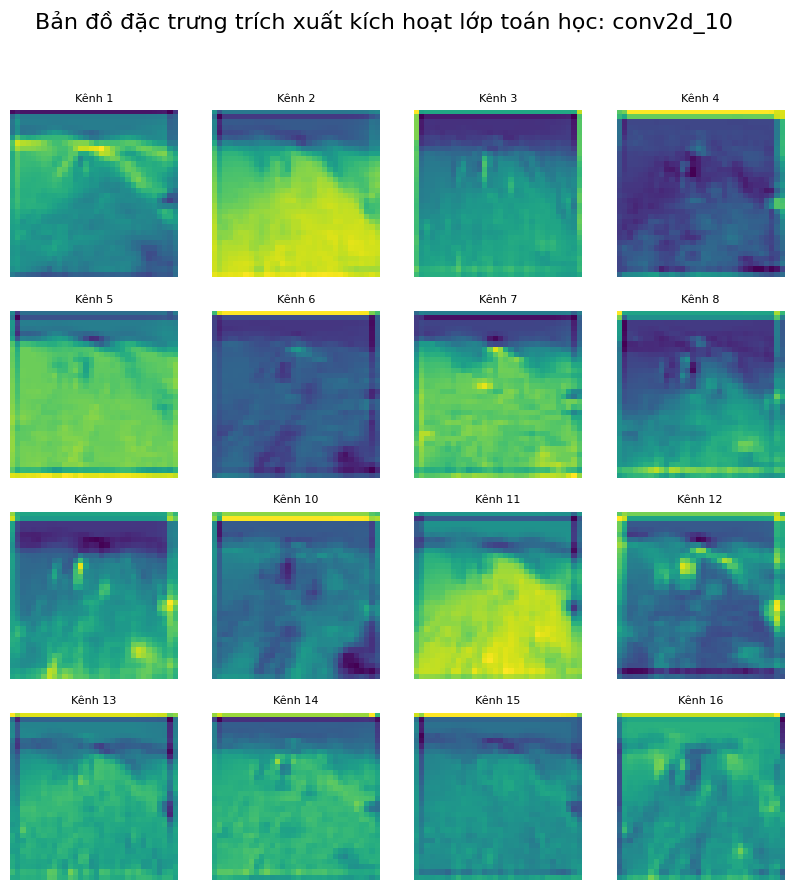

[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_feature_maps_conv2d_11.png


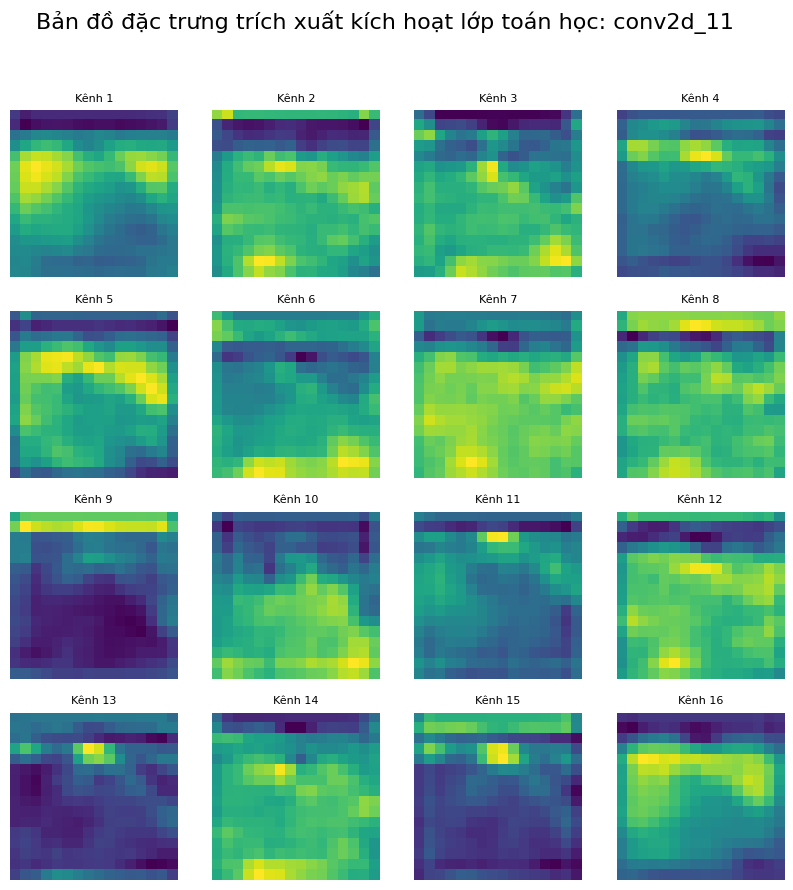

[+] Đã lưu bản đồ giải thích cấu trúc XAI: /content/drive/MyDrive/Do_an_co_so/KQ_XAI/xai_prediction_confidence.png


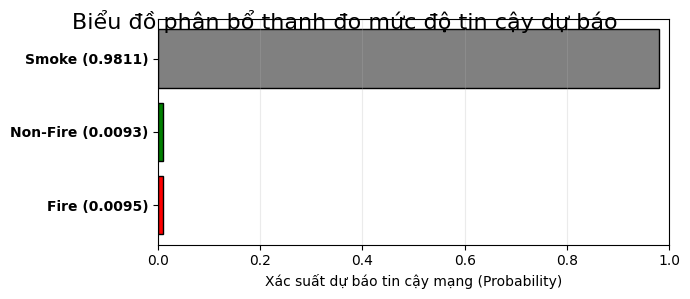

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

SAVE_DIR_XAI = "/content/drive/MyDrive/Do_an_co_so/KQ_XAI"

def save_xai_plot_as_png(filename, plot_title):
    full_path = os.path.join(SAVE_DIR_XAI, filename)
    plt.suptitle(plot_title, fontsize=16)
    plt.savefig(full_path, bbox_inches='tight', dpi=300)
    print(f"[+] Đã lưu bản đồ giải thích cấu trúc XAI: {full_path}")
    plt.show()
    plt.close()

# Tải cấu trúc trọng số tối ưu phục vụ phân tích thuật toán giải thích mô hình
try:
    model = tf.keras.models.load_model('/content/drive/MyDrive/Do_an_co_so/Model/best_forest_fire_model.h5')
    print("[+] Mô hình tải thành công phục vụ phân tích thuật toán giải thích mô hình XAI.")
except Exception as e:
    print(f"[!] Lỗi tải mô hình: {e}")

# Thuật toán sinh bản đồ nhiệt toán học Grad-CAM đa lớp chuyên sâu
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, target_class_idx):
    grad_model_inputs = tf.keras.Input(shape=model.input_shape[1:])
    x = grad_model_inputs
    last_conv_layer_output = None
    for layer in model.layers:
        x = layer(x)
        if layer.name == last_conv_layer_name:
            last_conv_layer_output = x
    model_output_tensor = x

    grad_model = tf.keras.models.Model(inputs=grad_model_inputs, outputs=[last_conv_layer_output, model_output_tensor])

    with tf.GradientTape() as tape:
        last_conv_layer_output_val, preds = grad_model(img_array)
        class_channel = preds[:, target_class_idx]

    grads = tape.gradient(class_channel, last_conv_layer_output_val)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output_single_image = last_conv_layer_output_val[0]
    heatmap = tf.squeeze(last_conv_layer_output_single_image @ pooled_grads[..., tf.newaxis])
    heatmap = tf.maximum(heatmap, 0)
    max_val = tf.math.reduce_max(heatmap)
    return (heatmap / (max_val + 1e-8)).numpy()

def _overlay_heatmap_on_image(heatmap, original_image, alpha=0.4):
    heatmap_resized = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))
    heatmap_colored = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_colored, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed_img = heatmap_colored * alpha + original_image
    return np.clip(superimposed_img, 0, 255).astype('uint8')

# Hàm hiển thị so sánh trực quan đa lớp Grad-CAM đối chứng khoa học
def display_gradcam_comparison(img_path, model, last_conv_layer_name, target_size=(128, 128)):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: return
    original_img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    processed_img = cv2.resize(original_img_rgb, target_size)
    img_array = np.expand_dims(processed_img, axis=0)

    class_indices = {'Fire': 0, 'Non-Fire': 1, 'Smoke': 2}
    try:
        heatmaps, overlays = {}, {}
        for class_name, idx in class_indices.items():
            heatmaps[class_name] = make_gradcam_heatmap(img_array, model, last_conv_layer_name, target_class_idx=idx)
            overlays[class_name] = _overlay_heatmap_on_image(heatmaps[class_name], original_img_rgb)

        plt.figure(figsize=(18, 12))
        plt.subplot(3, 3, 2)
        plt.imshow(original_img_rgb)
        plt.title("Ảnh Thực Tế Đầu Vào")
        plt.axis('off')

        for i, cls in enumerate(class_indices.keys()):
            plt.subplot(3, 3, i + 4)
            plt.imshow(heatmaps[cls], cmap='jet')
            plt.title(f"Bản đồ nhiệt Thô (Lớp: {cls})")
            plt.axis('off')

        for i, cls in enumerate(class_indices.keys()):
            plt.subplot(3, 3, i + 7)
            plt.imshow(overlays[cls])
            plt.title(f"Grad-CAM Chồng lớp (Overlay {cls})")
            plt.axis('off')

        save_xai_plot_as_png("xai_gradcam_comparison.png", "Thuật toán giải thích Grad-CAM: Bản đồ nhiệt chồng vùng nhận diện quyết định mạng")
    except Exception as e:
        print(f"[!] Lỗi sinh đồ thị giải thích Grad-CAM: {e}")

# Hàm hiển thị các bộ lọc (Filters) lớp đầu tiên chứng minh đặc trưng hình học học được
def visualize_first_layer_filters(model):
    first_conv_layer = None
    for layer in model.layers:
        if 'conv' in layer.name:
            first_conv_layer = layer
            break
    if first_conv_layer is None: return
    filters, biases = first_conv_layer.get_weights()
    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min + 1e-8)
    n_filters = min(16, filters.shape[3])
    plt.figure(figsize=(8, 8))
    for i in range(n_filters):
        f = filters[:, :, :, i]
        plt.subplot(4, 4, i+1)
        plt.imshow(f[:, :, 0], cmap='gray')
        plt.axis('off')
        plt.title(f'Filter {i+1}', fontsize=8)
    save_xai_plot_as_png("xai_first_layer_filters.png", f"Trực quan đặc trưng toán học các bộ lọc mạng ô tích chập của {first_conv_layer.name}")

# Hàm xuất bản đồ đặc trưng (Feature Maps) xuyên qua các lớp sâu lắng mạng
def visualize_feature_maps(model, img_path, target_size=(128, 128)):
    layer_names = [l.name for l in model.layers if 'conv' in l.name]
    if not layer_names: return
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: return
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, target_size)
    x = np.expand_dims(img_resized, axis=0).astype('float32')

    outputs = [model.get_layer(name).output for name in layer_names]
    feat_model = tf.keras.models.Model(inputs=model.inputs, outputs=outputs)
    feature_maps = feat_model.predict(x, verbose=0)

    for name, fmap in zip(layer_names, feature_maps):
        C = fmap.shape[-1]
        n_show = min(16, C)
        cols = 4
        rows = int(np.ceil(n_show/cols))
        plt.figure(figsize=(cols*2.5, rows*2.5))
        for i in range(n_show):
            plt.subplot(rows, cols, i+1)
            plt.imshow(fmap[0, :, :, i], cmap='viridis')
            plt.axis('off')
            plt.title(f"Kênh {i+1}", fontsize=8)
        save_xai_plot_as_png(f"xai_feature_maps_{name}.png", f"Bản đồ đặc trưng trích xuất kích hoạt lớp toán học: {name}")

# Hàm trực quan hóa cột độ tin cậy quyết định dự báo (Prediction Confidence Bar)
def prediction_confidence_bar(model, img_path, target_size=(128, 128)):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: return
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, target_size)
    x = np.expand_dims(img_resized, axis=0).astype('float32')
    probs = model.predict(x, verbose=0).ravel()
    class_names = ['Fire', 'Non-Fire', 'Smoke']
    plt.figure(figsize=(7, 3))
    y_pos = np.arange(len(class_names))
    plt.barh(y_pos, probs, color=['red', 'green', 'gray'], edgecolor='black')
    plt.yticks(y_pos, [f"{cls} ({p:.4f})" for cls, p in zip(class_names, probs)], fontweight='bold')
    plt.xlim(0, 1)
    plt.xlabel("Xác suất dự báo tin cậy mạng (Probability)")
    plt.grid(True, axis='x', alpha=0.25)
    plt.tight_layout()
    save_xai_plot_as_png("xai_prediction_confidence.png", "Biểu đồ phân bổ thanh đo mức độ tin cậy dự báo")

# Triển khai kích hoạt tiến trình giải thích mô hình toán học nâng cao
print("--- KHỞI ĐỘNG MODULE GIẢI THÍCH MÔ HÌNH HỌC SÂU MẠNG TÍCH CHẬP (XAI) ---")
last_conv_layer_name = ""
if model is not None:
    for layer in reversed(model.layers):
        if 'conv' in layer.name:
            last_conv_layer_name = layer.name
            break
    print(f"[+] Lớp tích chập cuối cùng được lựa chọn tự động: {last_conv_layer_name}")

    if not test_df.empty:
        random_sample = test_df.sample(n=1).iloc[0]
        sample_img_path = random_sample['filepath']
        print(f"[+] Lựa chọn ngẫu nhiên ảnh kiểm định trực quan XAI nhãn mẫu thực tế ({random_sample['label']}): {sample_img_path}")

        display_gradcam_comparison(sample_img_path, model, last_conv_layer_name)
        visualize_first_layer_filters(model)
        visualize_feature_maps(model, sample_img_path)
        prediction_confidence_bar(model, sample_img_path)
    else:
        print("[!] Không tìm thấy dữ liệu tập test tương thích cấu trúc.")

## 10: XÂY DỰNG VÀ TRIỂN KHAI ỨNG DỤNG DEMO VỚI GIAO DIỆN GRADIO

In [ ]:
import gradio as gr
import tensorflow as tf
import numpy as np
import cv2
import io
import datetime
import pandas as pd
import matplotlib.pyplot as plt

# Tải kiến trúc mô hình chạy thực nghiệm
model = globals().get('model', None)

if model is None:
    try:
        # Nếu RAM không có, thử tải từ Google Drive.
        model = tf.keras.models.load_model('/content/drive/MyDrive/Do_an_co_so/Model/best_forest_fire_model.h5')
        print("[+] Đã kết nối tải tệp lưu vết mô hình dự phòng từ Drive.")
    except Exception as e:
        print(f"[!] Hệ thống không tìm thấy file cấu hình trọng số: {e}")
        model = None # Khai báo rõ là None để không bị NameError ở hàm bên dưới

detection_history_list = []

# Hàm sinh bản đồ nhiệt tối ưu hóa luồng tương thích bộ nhớ đệm
def make_gradcam_heatmap_gradio(img_array, model_instance, last_conv_layer_name, target_class_idx):
    grad_model_inputs = tf.keras.Input(shape=model_instance.input_shape[1:])
    x = grad_model_inputs
    last_conv_layer_output = None
    for layer in model_instance.layers:
        x = layer(x)
        if layer.name == last_conv_layer_name:
            last_conv_layer_output = x
    model_output_tensor = x
    grad_model = tf.keras.models.Model(inputs=grad_model_inputs, outputs=[last_conv_layer_output, model_output_tensor])
    with tf.GradientTape() as tape:
        last_conv_layer_output_val, preds = grad_model(img_array)
        class_channel = preds[:, target_class_idx]
    grads = tape.gradient(class_channel, last_conv_layer_output_val)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output_single_image = last_conv_layer_output_val[0]
    heatmap = tf.squeeze(last_conv_layer_output_single_image @ pooled_grads[..., tf.newaxis])
    heatmap = tf.maximum(heatmap, 0)
    return (heatmap / (tf.math.reduce_max(heatmap) + 1e-8)).numpy()

def overlay_heatmap_gradio(heatmap, original_image, alpha=0.5):
    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    heatmap_colored = cv2.resize(heatmap_colored, (original_image.shape[1], original_image.shape[0]))
    return cv2.addWeighted(heatmap_colored, alpha, original_image, 1 - alpha, 0)

def get_last_conv_layer_name_gradio(model_instance):
    """
    Hàm tự động duyệt ngược các lớp của mô hình để tìm lớp tích chập cuối cùng
    """
    for layer in reversed(model_instance.layers):
        if 'conv' in layer.name:
            return layer.name
    return None
# Hàm sinh đồ thị cột độ tin cậy phân phối cho giao diện Gradio UI
def plot_confidence_bar_gradio(predictions):
    labels = ["CÓ CHÁY (FIRE)", "AN TOÀN (NON-FIRE)", "CÓ KHÓI (SMOKE)"]
    values = [float(predictions[0]), float(predictions[1]), float(predictions[2])]
    colors = [(1.0, 0.0, 0.0), (0.0, 0.5, 0.0), (0.5, 0.5, 0.5)]
    fig, ax = plt.subplots(figsize=(6, 3))
    bars = ax.barh(labels, values, color=colors, edgecolor='black')
    ax.set_xlim(0, 1)
    ax.set_xlabel("Mức xác suất")
    ax.invert_yaxis()
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.02, bar.get_y() + bar.get_height()/2, f'{width:.4f}', va='center', ha='left', color='black', fontweight='bold')
    plt.tight_layout()
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0.02)
    plt.close(fig)
    buf.seek(0)
    return (plt.imread(buf) * 255).astype(np.uint8)[:,:,:3]

def plot_raw_heatmaps_chart_gradio(hm_fire, hm_non_fire, hm_smoke):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(hm_fire, cmap='jet', vmin=0, vmax=1); axes[0].set_title("Heatmap 'Fire'"); axes[0].axis('off')
    axes[1].imshow(hm_non_fire, cmap='jet', vmin=0, vmax=1); axes[1].set_title("Heatmap 'Non-Fire'"); axes[1].axis('off')
    axes[2].imshow(hm_smoke, cmap='jet', vmin=0, vmax=1); axes[2].set_title("Heatmap 'Smoke'"); axes[2].axis('off')
    plt.tight_layout()
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0.02)
    plt.close(fig)
    buf.seek(0)
    return (plt.imread(buf) * 255).astype(np.uint8)[:,:,:3]

# Hàm tự động khoanh vùng khu vực nguy hiểm cục bộ (ROI - Bounding Boxes) dựa trên phân bổ năng lượng mạng tích chập
def draw_roi_on_image_gradio(original_image, heatmap_data, threshold=0.6, color=(255, 0, 0), label_text='DANGER'):
    heatmap_resized = cv2.resize(heatmap_data, (original_image.shape[1], original_image.shape[0]))
    binary_heatmap = (heatmap_resized > threshold).astype(np.uint8) * 255
    contours, _ = cv2.findContours(binary_heatmap, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_with_roi = original_image.copy()
    for contour in contours:
        if cv2.contourArea(contour) > 80:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(img_with_roi, (x, y), (x + w, y + h), color, 3)
            cv2.putText(img_with_roi, label_text, (x, y - 12), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    return img_with_roi

# Hàm dự toán logic trung tâm cho giao diện Gradio UI
def predict_fire_interface(image):
    if model is None or image is None:
        return {"Mô hình bị lỗi hệ thống": 0.0}, None, None, None, None, pd.DataFrame(detection_history_list)

    img_resized = cv2.resize(image, (128, 128))
    img_expanded = np.expand_dims(img_resized, axis=0)

    # Dự báo phân tích đa lớp kết quả
    predictions = model.predict(img_expanded)[0]
    class_ui_labels = ["CÓ CHÁY (FIRE)", "AN TOÀN (NON-FIRE)", "CÓ KHÓI (SMOKE)"]
    pred_idx = np.argmax(predictions)
    label_text_main = class_ui_labels[pred_idx]

    label_output = {class_ui_labels[i]: float(predictions[i]) for i in range(3)}
    confidence_plot_img = plot_confidence_bar_gradio(predictions)

    last_conv_layer = get_last_conv_layer_name_gradio(model)
    if last_conv_layer is None:
        return label_output, None, None, confidence_plot_img, image, pd.DataFrame(detection_history_list)

    try:
        hm_fire = make_gradcam_heatmap_gradio(img_expanded, model, last_conv_layer, target_class_idx=0)
        hm_non_fire = make_gradcam_heatmap_gradio(img_expanded, model, last_conv_layer, target_class_idx=1)
        hm_smoke = make_gradcam_heatmap_gradio(img_expanded, model, last_conv_layer, target_class_idx=2)

        overlay_fire = overlay_heatmap_gradio(hm_fire, image)
        overlay_non_fire = overlay_heatmap_gradio(hm_non_fire, image)
        overlay_smoke = overlay_heatmap_gradio(hm_smoke, image)

        combined_heatmap_plot = plot_raw_heatmaps_chart_gradio(hm_fire, hm_non_fire, hm_smoke)
        combined_raw_image = np.hstack((overlay_fire, overlay_non_fire, overlay_smoke))

        roi_image = image.copy()
        if pred_idx == 0:
            roi_image = draw_roi_on_image_gradio(roi_image, hm_fire, threshold=0.6, color=(255, 0, 0), label_text='FIRE AREA')
        elif pred_idx == 2:
            roi_image = draw_roi_on_image_gradio(roi_image, hm_smoke, threshold=0.6, color=(128, 128, 128), label_text='SMOKE AREA')
    except Exception as e:
        print(f"[!] Lỗi biên dịch xử lý luồng Heatmap UI: {e}")
        combined_heatmap_plot, combined_raw_image, roi_image = None, None, image

    # Thiết lập nhật ký thời gian thực thực thi hệ thống kiểm soát thông minh
    timestamp = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    log_entry = {
        "Thời gian kích hoạt": timestamp,
        "Chẩn đoán quyết định": label_text_main,
        "Xác suất Lửa (Fire)": f"{predictions[0]:.4f}",
        "Xác suất Khói (Smoke)": f"{predictions[2]:.4f}",
        "Cảnh báo Nguy hiểm?": "BÁO ĐỘNG ĐỎ" if (pred_idx == 0 or pred_idx == 2) else "AN TOÀN"
    }
    detection_history_list.insert(0, log_entry)
    if len(detection_history_list) > 10:
        detection_history_list.pop()

    return label_output, combined_heatmap_plot, combined_raw_image, confidence_plot_img, roi_image, pd.DataFrame(detection_history_list)

# Tạo lập khung giao diện UI Đồ án Khoa học dữ liệu cao cấp bằng Gradio Blocks
interface = gr.Interface(
    fn=predict_fire_interface,
    inputs=gr.Image(label="Tải tài nguyên hình ảnh hiện trường đám cháy lên hệ thống"),
    outputs=[
        gr.Label(num_top_classes=3, label="Phân tích xác suất nhận diện (Mô hình toán học Đa lớp)"),
        gr.Image(label="Hệ thống ma trận Bản đồ nhiệt phân lớp đối sánh (Raw Heatmaps)", type="numpy"),
        gr.Image(label="Ảnh tích hợp chồng lớp định vị không gian (Grad-CAM Overlays Side-by-Side)", type="numpy"),
        gr.Image(label="Trực quan biểu đồ cột mức độ tin cậy quyết định dự phòng", type="numpy"),
        gr.Image(label="Tự động phát hiện khoanh vùng đối tượng đám cháy nguy hiểm (ROI Bounding Boxes)", type="numpy"),
        gr.Dataframe(label="Hệ thống cơ sở dữ liệu Nhật ký lịch sử phát hiện đám cháy thời gian thực")
    ],
    title="🔥 HỆ THỐNG PHÁT HIỆN ĐÁM CHÁY & KHÓI RỪNG BẰNG MÔ HÌNH HỌC SÂU CNN CÓ GIẢI THÍCH (HEATMAP XAI DEMO)",
    description="Hệ thống tích hợp thuật toán CNN trích xuất đặc trưng hình học kết hợp phương pháp giải thích Grad-CAM nhằm khoanh vùng định vị tọa độ phân bổ năng lượng đám cháy, hỗ trợ tối đa công tác cứu nạn.",
    theme="default"
)

# Khởi chạy hệ thống liên kết máy chủ ảo phát hành đường link chia sẻ trực tuyến (Public Share Link)
interface.launch(share=True, debug=True)

[+] Đã kết nối tải tệp lưu vết mô hình dự phòng từ Drive.
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://a66b2f82742db533fb.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
